# GEX data preprocessing

## 1) Preliminaries

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import os
import warnings
import matplotlib.pylab as plt
import scanpy.external as sce
from itertools import combinations
import scipy
import diffxpy.api as de
import re
from IPython.display import Markdown, display

In [2]:
!pip3 install --user harmonypy

In [3]:
data_folder = "../data"
result_folder = '../Result'
graph_folder = '../Graph'

In [4]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=100)
sc.logging.print_header()
sc.settings.figdir = graph_folder + '/'

scanpy==1.7.0 anndata==0.7.6 umap==0.4.6 numpy==1.18.5 scipy==1.6.1 pandas==1.2.2 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 leidenalg==0.8.3


In [5]:
warnings.filterwarnings("ignore")

## 2) Read anndata from h5ad file

In [6]:
dataset_name = "complete-gex-dataset.h5ad"
adata = sc.read_h5ad(os.path.join(data_folder, dataset_name))
adata

AnnData object with n_obs × n_vars = 207233 × 16609
    obs: 'n_genes', 'sample_tag', 'patient', 'time', 'lab_id', 'DOB', 'sex', 'ht', 'VES', 'PCR', 'FIBRINOGENO', 'ANTITROMB', 'sCD40L', 'EGF', 'Eotaxin', 'FGF-2', 'FLT-3L', 'Fractalkine', 'G-CSF', 'GM-CSF', 'GROalpha', 'IFNalpha2', 'IFNgamma', 'IL-1alpha', 'IL-1beta', 'IL-1RA', 'IL-2', 'IL-3', 'IL-4', 'IL-5', 'IL-6', 'IL-7', 'IL-8', 'IL-9', 'IL-10', 'IL-12p40', 'IL-12p70', 'IL-13', 'IL-15', 'IL-17A', 'IL-17E/IL-25', 'IL-17F', 'IL-18', 'IL-22', 'IL-27', 'IP-10', 'MCP-1', 'MCP-3', 'M-CSF', 'MDC', 'MIG', 'MIP-1alpha', 'MIP-1beta', 'PDGF-AA', 'PDGF-AB/BB', 'TGFalpha', 'TNFalpha', 'TNFbeta', 'VEGF-A', 'IgA', 'IgG', 'days_from_symptoms_to_admission', 'severity', 'age', 'alcohol', 'smoke', 'fever', 'cough', 'pneumo', 'oxygen', 'comorbities', 'hypertension', 'batch_id'

In [7]:
adata.obs.head()

,n_genes,sample_tag,patient,time,lab_id,DOB,sex,ht,VES,PCR,...,age,alcohol,smoke,fever,cough,pneumo,oxygen,comorbities,hypertension,batch_id
580700-B_WTA,7531,B_WTA-Multiplet,nan,nan,nan,NaN,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B_WTA
237104-B_WTA,6653,B_WTA-Multiplet,nan,nan,nan,NaN,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B_WTA
557392-B_WTA,7039,B_WTA-Multiplet,nan,nan,nan,NaN,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B_WTA
47958-B_WTA,6230,B_WTA-Multiplet,nan,nan,nan,NaN,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B_WTA
255102-B_WTA,6034,B_WTA-Multiplet,nan,nan,nan,NaN,nan,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,B_WTA


In [8]:
adata.var.head()

""
ab_CD103|ITGAE|AHS0001|pAbO
ab_CD10|MME|AHS0051|pAbO
ab_CD117:YB5.B8|KIT|AHS0064|pAbO
ab_CD11b:ICRF44|ITGAM|AHS0184|pAbO
ab_CD11c:S-HCL-3|ITGAX|AHS0183|pAbO


## 3) Initial quality metrics: total counts, number of genes, ab.s, mitochondrial and ribosomial DNA

normalizing counts per cell
    finished (0:00:02)


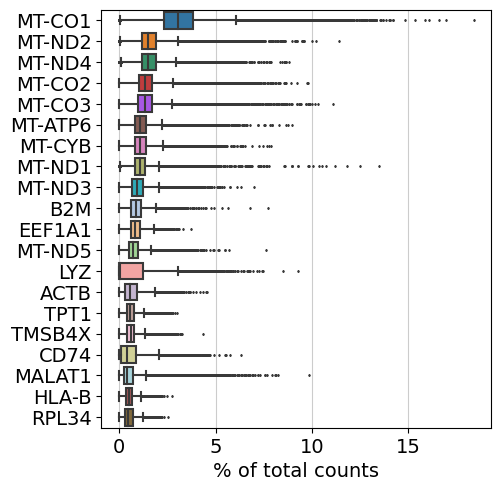

In [9]:
sc.pl.highest_expr_genes(adata[:, ~ adata.var_names.str.startswith("ab_")], n_top=20)

normalizing counts per cell
    finished (0:00:00)


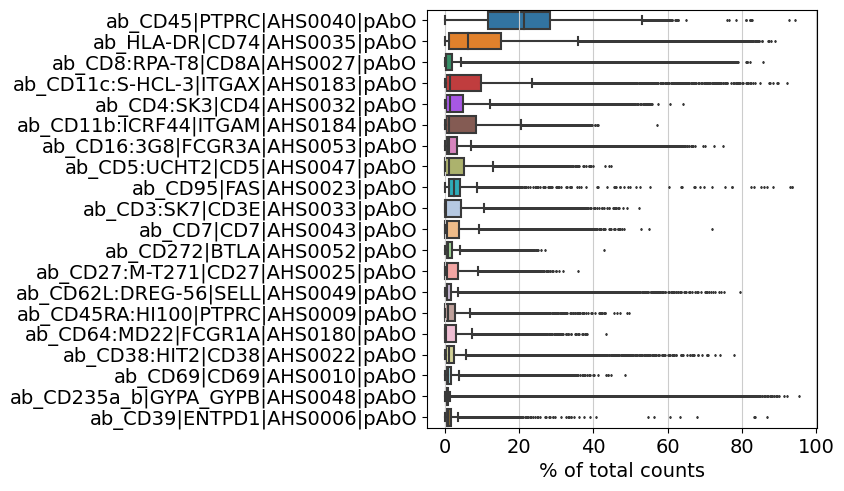

In [10]:
sc.pl.highest_expr_genes(adata[:, adata.var_names.str.startswith("ab_")], n_top=20)

Annotate the group of mitochondrial genes as 'mt', the ribosomial genes as 'rb' and the ab-seq count as "ab" and compute qc metrics

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rb'] = adata.var_names.str.startswith(("RPS","RPL"))
adata.var['ab'] = adata.var_names.str.startswith('ab_')

In [12]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['ab'], percent_top=None, log1p=False, inplace=True)

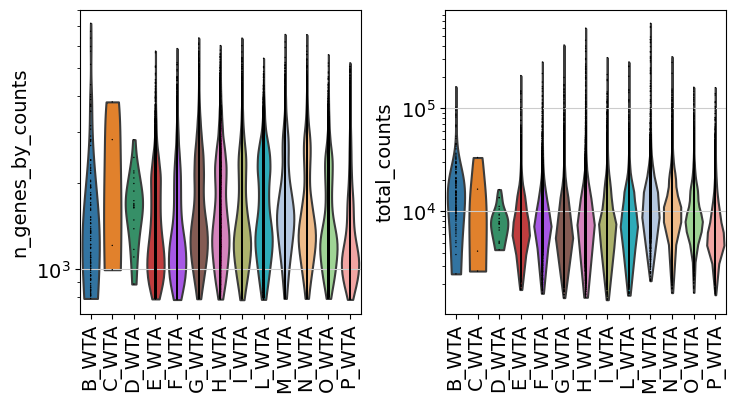

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], groupby='batch_id', multi_panel=True,
             jitter=False, log=True, rotation=90.)

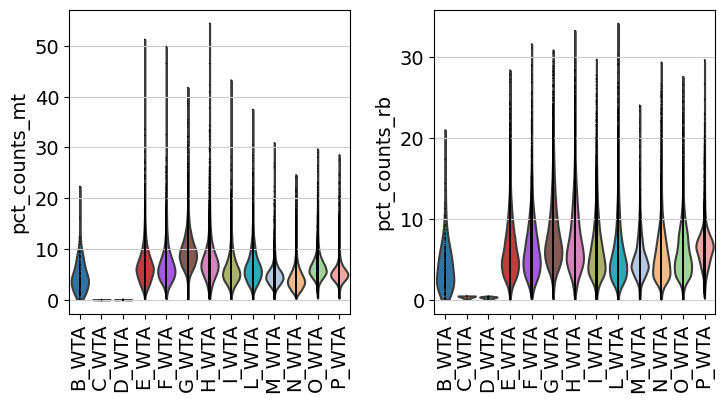

In [14]:
sc.pl.violin(adata, ['pct_counts_mt', 'pct_counts_rb'], groupby='batch_id', multi_panel=True,
             jitter=False, rotation=90.)

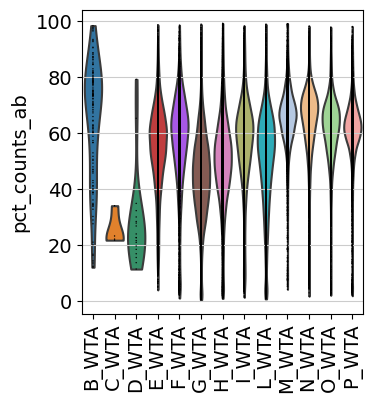

In [15]:
sc.pl.violin(adata, ['pct_counts_ab'], groupby='batch_id', multi_panel=True, jitter=False,
             rotation=90.)

Compute quantiles of the mitochondial percentage distribution

In [16]:
print(np.quantile(adata.obs['pct_counts_mt'], [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

[ 0.          3.20135937  4.05094252  4.68940496  5.2720026   5.86828041
  6.54652481  7.40316448  8.55997772 10.44628067 54.44283295]


Joint distribution plots

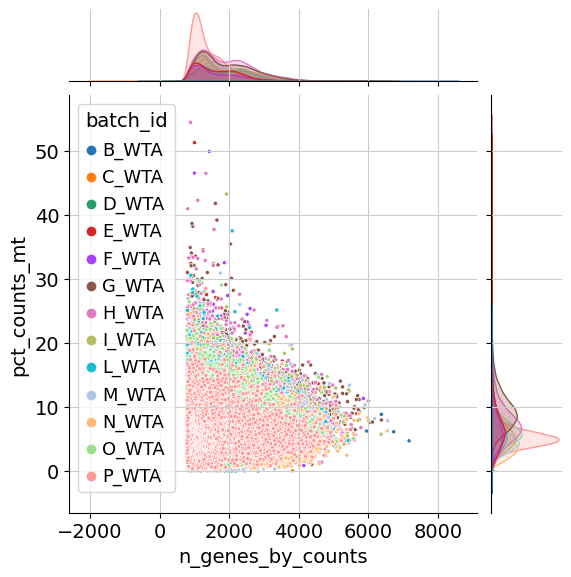

In [17]:
sns.jointplot(data=adata.obs, x='n_genes_by_counts', y='pct_counts_mt', hue="batch_id", marker=".")

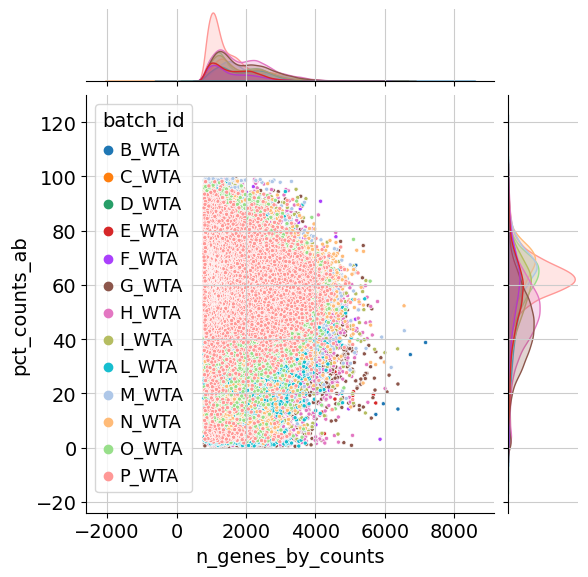

In [18]:
sns.jointplot(data=adata.obs, x='n_genes_by_counts', y='pct_counts_ab', hue="batch_id", marker=".")

## 4) Quality filters on cells

### remove low quality cells and hardly expressed genes
Filter genes from anndata, using the following thresholds:
- MIN_CELLS = filter out genes that are expressed in less cells than this threshold
- MT_PERCENTAGE = cells that have larger percentage of mitochondrial counts are filtered out

<mark>**the filter for cells with less than MIN_GENES=800 genes expressed has already
been applied before concatenating the anndata of the different batches**</mark>


In [19]:
MIN_CELLS = 50
MT_PERCENTAGE = 30

In [20]:
print("nr. cells = {}\nnr. vars (genes + ab.s) = {}".format(adata.n_obs, adata.n_vars))

nr. cells = 207233
nr. vars (genes + ab.s) = 16609


In [21]:
sc.pp.filter_genes(adata, min_cells=MIN_CELLS)

filtered out 674 genes that are detected in less than 50 cells


In [22]:
adata[adata.obs.pct_counts_mt >= MT_PERCENTAGE, :].n_obs

42

In [23]:
adata = adata[adata.obs.pct_counts_mt < MT_PERCENTAGE, :]

In [24]:
print("nr. cells = {}\nnr. vars (genes + ab.s) = {}".format(adata.n_obs, adata.n_vars))

nr. cells = 207191
nr. vars (genes + ab.s) = 15935


## 5) Metrics after filters: total counts, number of genes, ab.s, mitochondrial and ribosomial DNA

normalizing counts per cell
    finished (0:00:02)


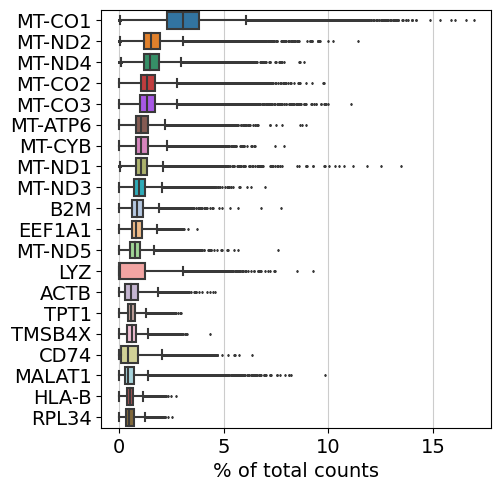

In [25]:
sc.pl.highest_expr_genes(adata[:, ~ adata.var_names.str.startswith("ab_")], n_top=20)

normalizing counts per cell
    finished (0:00:00)


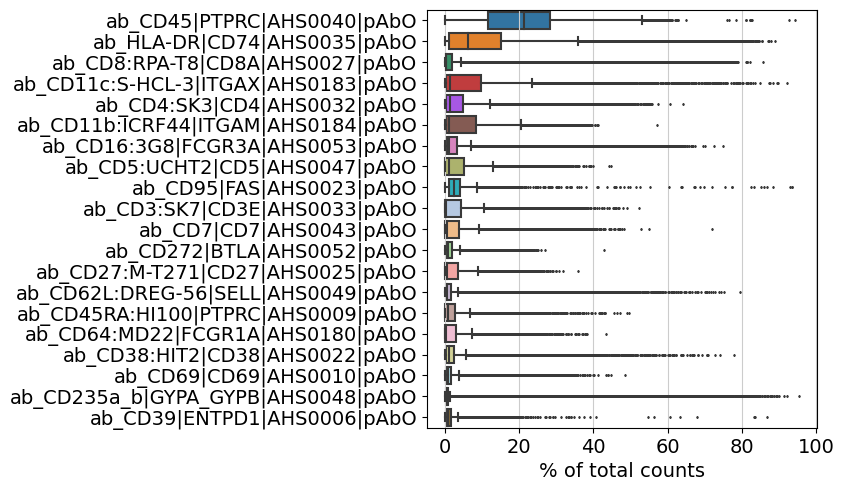

In [26]:
sc.pl.highest_expr_genes(adata[:, adata.var_names.str.startswith("ab_")], n_top=20)

Annotate the group of mitochondrial genes as 'mt', the ribosomial genes as 'rb' and the ab-seq count as "ab" and compute qc metrics

In [27]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rb'] = adata.var_names.str.startswith(("RPS","RPL"))
adata.var['ab'] = adata.var_names.str.startswith('ab_')

Trying to set attribute `.var` of view, copying.


In [28]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['ab'], percent_top=None, log1p=False, inplace=True)

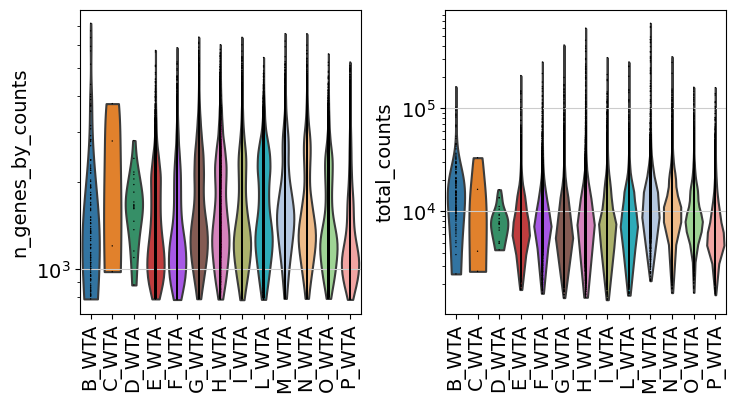

In [29]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], groupby='batch_id', multi_panel=True,
             jitter=False, log=True, rotation=90.)

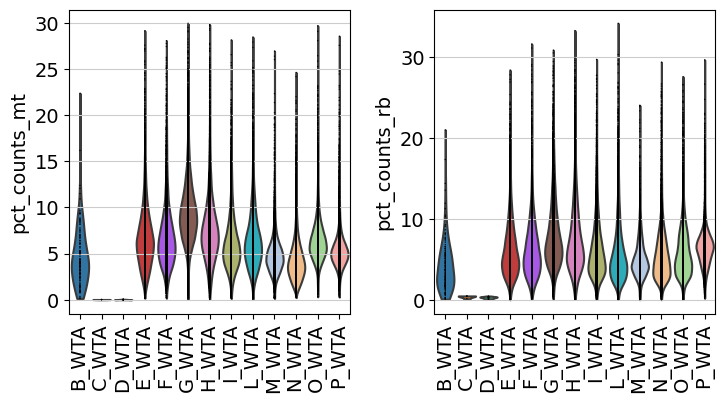

In [30]:
sc.pl.violin(adata, ['pct_counts_mt', 'pct_counts_rb'], groupby='batch_id', multi_panel=True,
             jitter=False, rotation=90.)

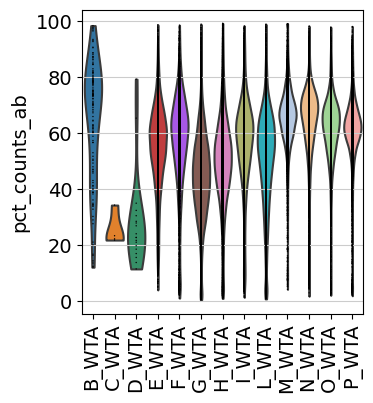

In [31]:
sc.pl.violin(adata, ['pct_counts_ab'], groupby='batch_id', multi_panel=True, jitter=False,
             rotation=90.)

Compute quantiles of the mitochondial percentage distribution

In [32]:
print(np.quantile(adata.obs['pct_counts_mt'], [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

[ 0.          3.20121956  4.05047846  4.68908596  5.27166891  5.86791229
  6.54561663  7.4020319   8.55804539 10.44215965 29.91184044]


Joint distribution plots

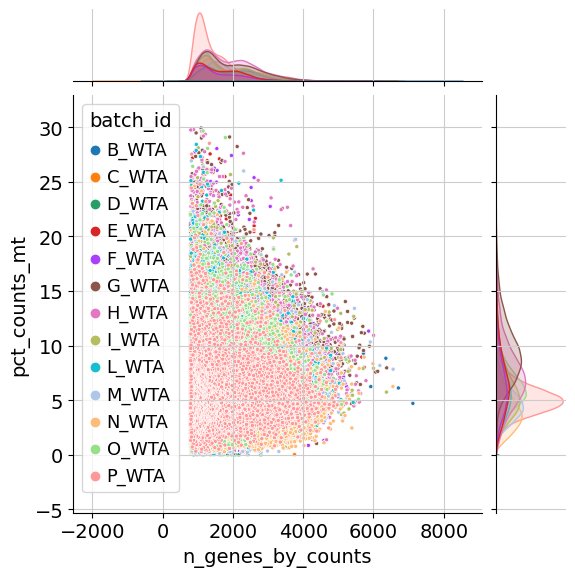

In [33]:
sns.jointplot(data=adata.obs, x='n_genes_by_counts', y='pct_counts_mt', hue="batch_id", marker=".")

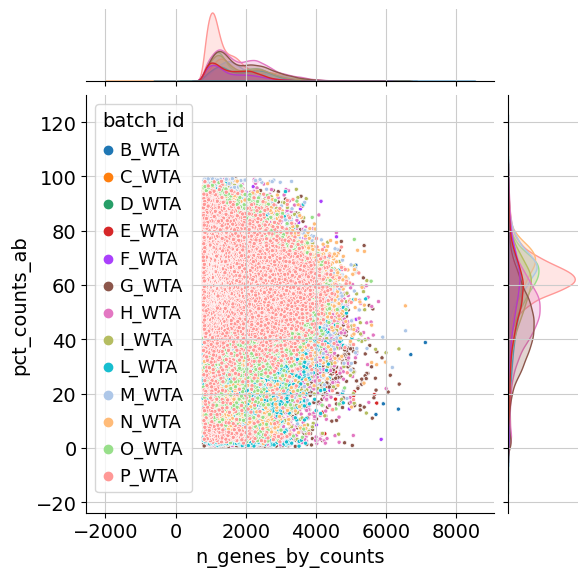

In [34]:
sns.jointplot(data=adata.obs, x='n_genes_by_counts', y='pct_counts_ab', hue="batch_id", marker=".")

## 6) Log-normalization

In [35]:
adata.raw = adata

now normalize and put data on logarithmic scale

In [36]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


Identify highly-variable genes.

In [37]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    Gene indices [36, 51] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


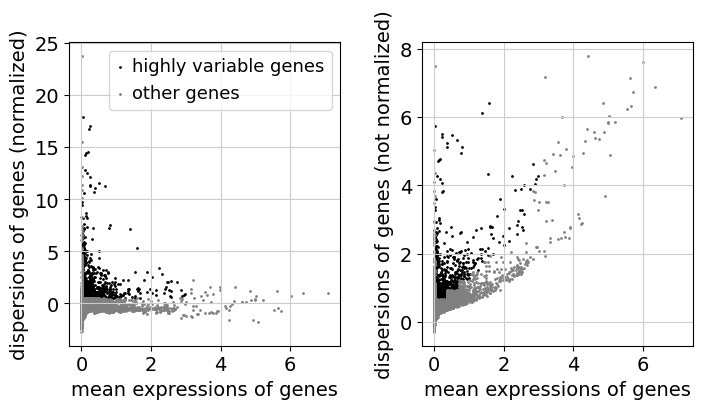

In [38]:
sc.pl.highly_variable_genes(adata)

## 7) Principal component analysis and dimensionality reduction
compute PCA

In [39]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:33)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


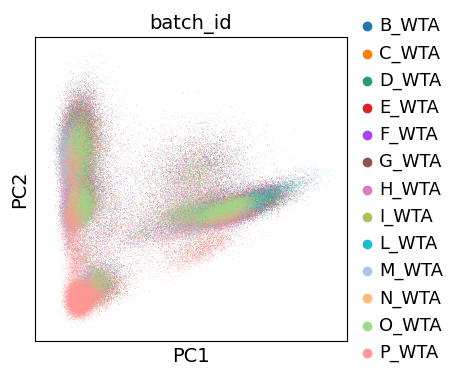

In [40]:
sc.pl.pca(adata, color="batch_id", ncols=3)

plot some relevant markers in the PC1 vs PC2 graph

In [41]:
ab_markers = ["ab_CD19:SJ25C1|CD19|AHS0030|pAbO",    # B lymphocytes
              "ab_CD11b:ICRF44|ITGAM|AHS0184|pAbO",  # monocytes
              "ab_CD3:SK7|CD3E|AHS0033|pAbO"]        # T lymphocytes

In [42]:
gene_markers = ["MS4A1",  # B lymphocytes
                "CD3E",   # T lymphocytes
                "CD8A",   # CD8 T
                "LYZ",    # monocytes
                "GNLY",   # NK
                "IL7R",   # CD4 T
                "PPBP",   # platelets
                "MKI67",  # proliferating
                "FCGR1A", # dendritic cells
                "FCGR3A", # monocytes CD14+
                "MZB1"  ]  # plasma cells

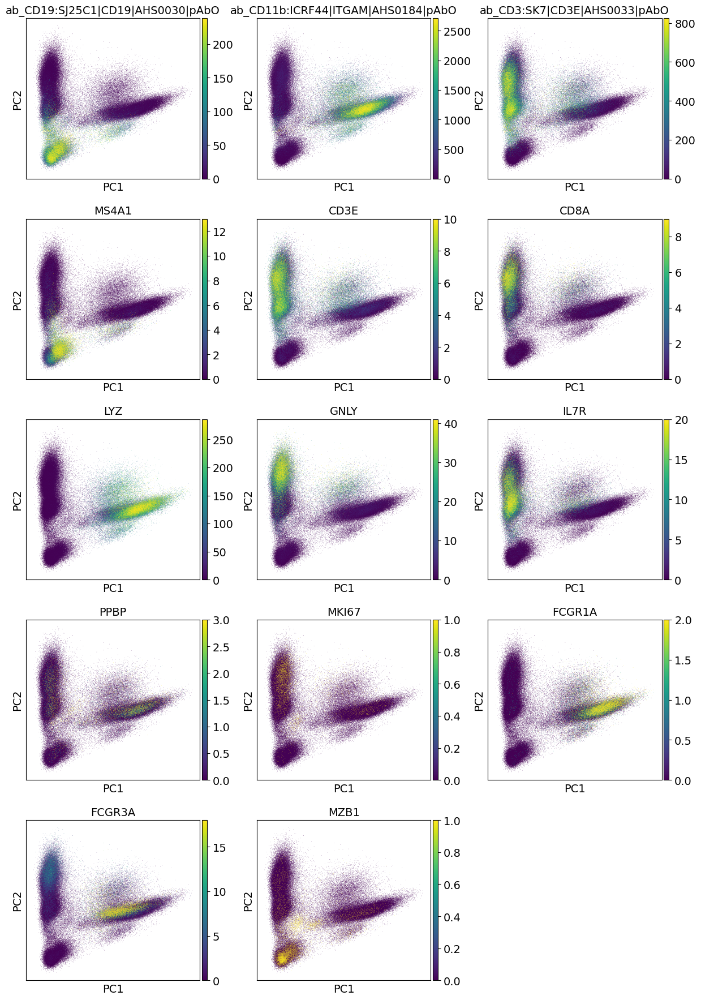

In [43]:
sc.pl.pca(adata, color=ab_markers + gene_markers, ncols=3, color_map="viridis", vmax="p98", vmin=0.)

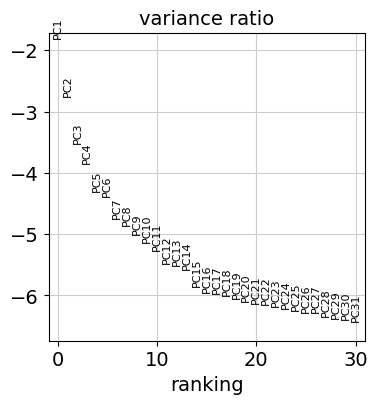

In [44]:
sc.pl.pca_variance_ratio(adata, log=True)

use Harmony to correct PC for batch effects

In [45]:
sce.pp.harmony_integrate(adata, 'batch_id')

2023-02-06 16:26:08,687 - harmonypy - INFO - Iteration 1 of 10
2023-02-06 16:27:38,748 - harmonypy - INFO - Iteration 2 of 10
2023-02-06 16:29:16,147 - harmonypy - INFO - Iteration 3 of 10
2023-02-06 16:30:59,637 - harmonypy - INFO - Iteration 4 of 10
2023-02-06 16:32:37,254 - harmonypy - INFO - Iteration 5 of 10
2023-02-06 16:34:18,923 - harmonypy - INFO - Converged after 5 iterations


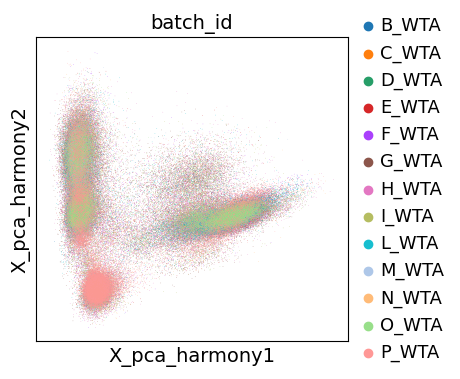

In [46]:
sc.pl.embedding(adata, "X_pca_harmony", color="batch_id")

now compute the 1) neighbors, 2) PAGA and then 3) UMAP on harmony-corrected PCs

In [47]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40, use_rep="X_pca_harmony")

computing neighbors
    computing neighbors
    computed neighbors (0:02:07)
    computed connectivities (0:00:09)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:16)


In [48]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:21)


running PAGA
        initialized `.distances` `.connectivities` 
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:12)
--> added 'pos', the PAGA positions (adata.uns['paga'])


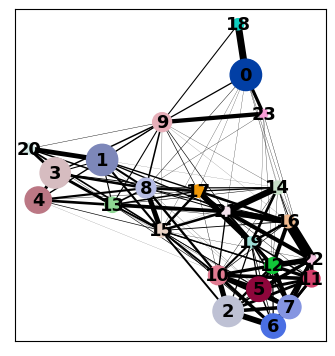

In [49]:
sc.tl.paga(adata)
sc.pl.paga(adata)

In [50]:
sc.tl.umap(adata, init_pos='paga')

computing UMAP


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:33)


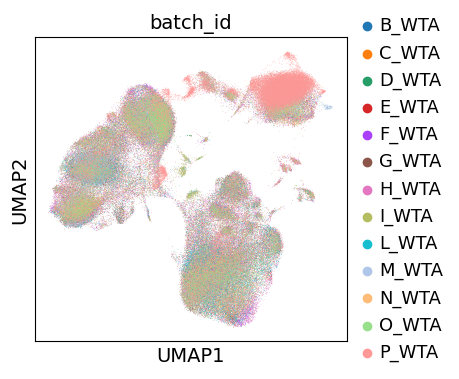

In [51]:
sc.pl.umap(adata, color=['batch_id'])

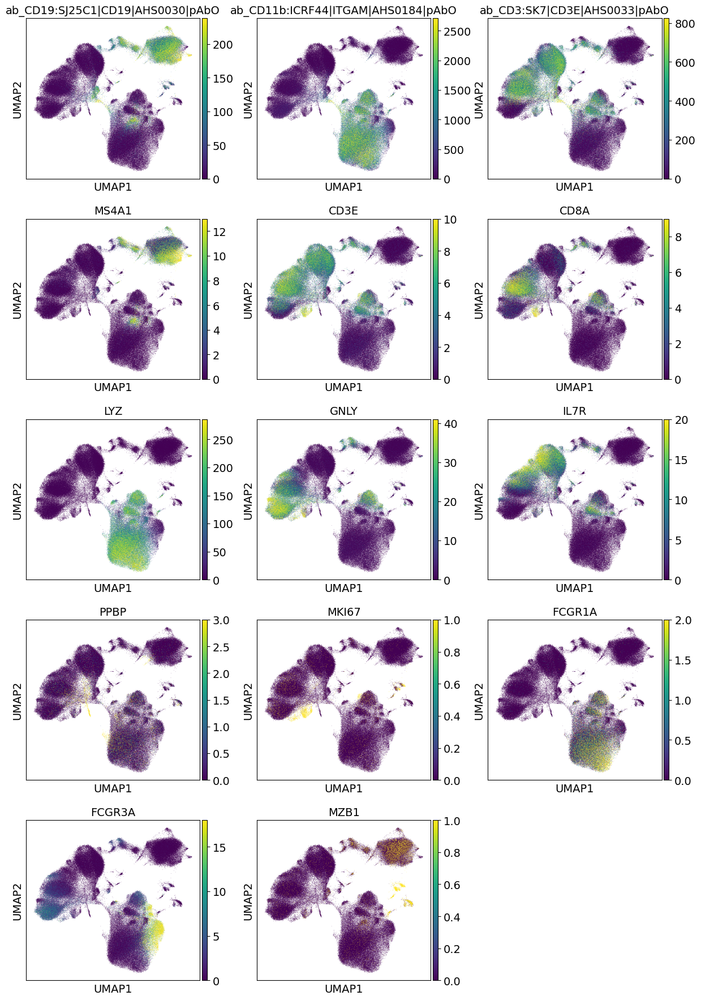

In [52]:
sc.pl.umap(adata, color=ab_markers + gene_markers, ncols=3, color_map="viridis", vmax="p98", vmin=0.)

## 8) Discard batches B, C and D

B, C and D after quality filters include a few cells

<AxesSubplot:xlabel='batch_id', ylabel='Count'>

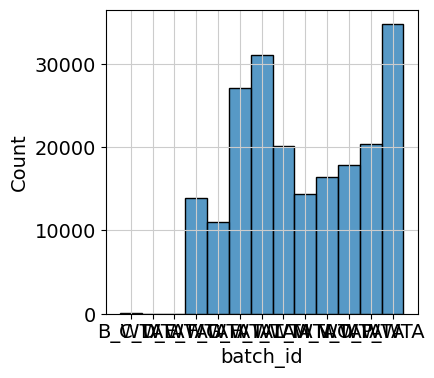

In [53]:
sns.histplot(adata.obs, x="batch_id", stat="count")

In [54]:
adata = adata[(adata.obs["batch_id"] != "B_WTA") & (adata.obs["batch_id"] != "C_WTA") & (adata.obs["batch_id"] != "D_WTA"), :]
adata

View of AnnData object with n_obs × n_vars = 207036 × 15935
    obs: 'n_genes', 'sample_tag', 'patient', 'time', 'lab_id', 'DOB', 'sex', 'ht', 'VES', 'PCR', 'FIBRINOGENO', 'ANTITROMB', 'sCD40L', 'EGF', 'Eotaxin', 'FGF-2', 'FLT-3L', 'Fractalkine', 'G-CSF', 'GM-CSF', 'GROalpha', 'IFNalpha2', 'IFNgamma', 'IL-1alpha', 'IL-1beta', 'IL-1RA', 'IL-2', 'IL-3', 'IL-4', 'IL-5', 'IL-6', 'IL-7', 'IL-8', 'IL-9', 'IL-10', 'IL-12p40', 'IL-12p70', 'IL-13', 'IL-15', 'IL-17A', 'IL-17E/IL-25', 'IL-17F', 'IL-18', 'IL-22', 'IL-27', 'IP-10', 'MCP-1', 'MCP-3', 'M-CSF', 'MDC', 'MIG', 'MIP-1alpha', 'MIP-1beta', 'PDGF-AA', 'PDGF-AB/BB', 'TGFalpha', 'TNFalpha', 'TNFbeta', 'VEGF-A', 'IgA', 'IgG', 'days_from_symptoms_to_admission', 'severity', 'age', 'alcohol', 'smoke', 'fever', 'cough', 'pneumo', 'oxygen', 'comorbities', 'hypertension', 'batch_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'total_counts_ab', 'pct_counts_ab', 'leiden'
    var: 'mt',

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

## 9) Define clustering and UMAP based only on ab counts

create the dataset

In [55]:
adata_absonly = adata[:, adata.var_names.str.startswith("ab_")]
adata_absonly = sc.AnnData(X=adata_absonly.X,
                           obs=adata_absonly.obs,
                           var=adata_absonly.var)

In [56]:
ab_list = list(adata_absonly.var_names)
ab_list

['ab_CD103|ITGAE|AHS0001|pAbO',
 'ab_CD10|MME|AHS0051|pAbO',
 'ab_CD117:YB5.B8|KIT|AHS0064|pAbO',
 'ab_CD11b:ICRF44|ITGAM|AHS0184|pAbO',
 'ab_CD11c:S-HCL-3|ITGAX|AHS0183|pAbO',
 'ab_CD123|IL3RA|AHS0020|pAbO',
 'ab_CD127|IL7R|AHS0028|pAbO',
 'ab_CD13|ANPEP|AHS0050|pAbO',
 'ab_CD14|Cd14|AMM2070|pAbO',
 'ab_CD152|CTLA4|AHS0017|pAbO',
 'ab_CD161:DX12|KLRB1|AHS0002|pAbO',
 'ab_CD16:3G8|FCGR3A|AHS0053|pAbO',
 'ab_CD183|CXCR3|AHS0031|pAbO',
 'ab_CD194|CCR4|AHS0038|pAbO',
 'ab_CD196|CCR6|AHS0034|pAbO',
 'ab_CD197|CCR7|AHS0007|pAbO',
 'ab_CD19:SJ25C1|CD19|AHS0030|pAbO',
 'ab_CD20:2H7|MS4A1|AHS0008|pAbO',
 'ab_CD235a_b|GYPA_GYPB|AHS0048|pAbO',
 'ab_CD24|CD24|AHS0042|pAbO',
 'ab_CD25:2A3|IL2RA|AHS0026|pAbO',
 'ab_CD272|BTLA|AHS0052|pAbO',
 'ab_CD274|CD274|AHS0004|pAbO',
 'ab_CD275|ICOSLG|AHS0011|pAbO',
 'ab_CD278|ICOS|AHS0012|pAbO',
 'ab_CD279:MIH4|PDCD1|AHS0190|pAbO',
 'ab_CD27:M-T271|CD27|AHS0025|pAbO',
 'ab_CD28:CD28.2|CD28|AHS0024|pAbO',
 'ab_CD294|PTGDR2|AHS0106|pAbO',
 'ab_CD33:WM53|CD33|AH

### define clustering based on harmony integrated ab-seq variables

In [57]:
adata_absonly

AnnData object with n_obs × n_vars = 207036 × 52
    obs: 'n_genes', 'sample_tag', 'patient', 'time', 'lab_id', 'DOB', 'sex', 'ht', 'VES', 'PCR', 'FIBRINOGENO', 'ANTITROMB', 'sCD40L', 'EGF', 'Eotaxin', 'FGF-2', 'FLT-3L', 'Fractalkine', 'G-CSF', 'GM-CSF', 'GROalpha', 'IFNalpha2', 'IFNgamma', 'IL-1alpha', 'IL-1beta', 'IL-1RA', 'IL-2', 'IL-3', 'IL-4', 'IL-5', 'IL-6', 'IL-7', 'IL-8', 'IL-9', 'IL-10', 'IL-12p40', 'IL-12p70', 'IL-13', 'IL-15', 'IL-17A', 'IL-17E/IL-25', 'IL-17F', 'IL-18', 'IL-22', 'IL-27', 'IP-10', 'MCP-1', 'MCP-3', 'M-CSF', 'MDC', 'MIG', 'MIP-1alpha', 'MIP-1beta', 'PDGF-AA', 'PDGF-AB/BB', 'TGFalpha', 'TNFalpha', 'TNFbeta', 'VEGF-A', 'IgA', 'IgG', 'days_from_symptoms_to_admission', 'severity', 'age', 'alcohol', 'smoke', 'fever', 'cough', 'pneumo', 'oxygen', 'comorbities', 'hypertension', 'batch_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'total_counts_ab', 'pct_counts_ab', 'leiden'
    var: 'mt', 'rb', 'ab'

compute PCA, perform harmony correction, compute neighbors and UMAP

In [58]:
sc.tl.pca(adata_absonly, n_comps=50, use_highly_variable=False)

computing PCA
    with n_comps=50
    finished (0:00:03)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


In [59]:
sce.pp.harmony_integrate(adata_absonly, 'batch_id')

2023-02-06 16:45:16,923 - harmonypy - INFO - Iteration 1 of 10
2023-02-06 16:47:27,348 - harmonypy - INFO - Iteration 2 of 10
2023-02-06 16:49:12,552 - harmonypy - INFO - Iteration 3 of 10
2023-02-06 16:50:50,832 - harmonypy - INFO - Iteration 4 of 10
2023-02-06 16:52:37,297 - harmonypy - INFO - Converged after 4 iterations


In [60]:
sc.pp.neighbors(adata_absonly, n_neighbors=15, use_rep="X_pca_harmony")

computing neighbors
    computing neighbors
    computed neighbors (0:01:30)
    computed connectivities (0:00:05)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:35)


define clustering based on these neighbors

In [61]:
sc.tl.leiden(adata_absonly, resolution=1., key_added="leiden_abseq_harmony")

running Leiden clustering
    finished: found 32 clusters and added
    'leiden_abseq_harmony', the cluster labels (adata.obs, categorical) (0:02:15)


plot the clustering and other variables using this UMAP

computing UMAP


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:07)


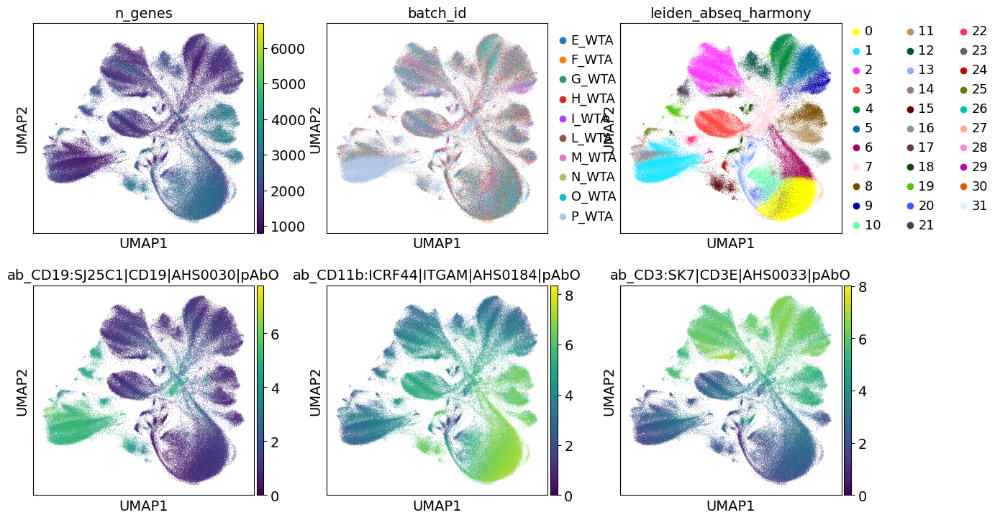

In [62]:
sc.tl.umap(adata_absonly)
sc.pl.umap(adata_absonly, color=['n_genes', "batch_id", "leiden_abseq_harmony"] + ab_markers, ncols=3)

save UMAP and PCA in the main dataset

In [63]:
adata.obsm["X_umap_abseq_harmony"] = adata_absonly.obsm["X_umap"]
adata.obsm["X_pca_abseq_harmony"] = adata_absonly.obsm["X_pca_harmony"]

save clustering based on ab-seq in the main dataset

In [64]:
adata.obs["leiden_abseq_harmony"] = adata_absonly.obs['leiden_abseq_harmony']

In [65]:
del adata_absonly

## 10) exclude unassigned cells (doublets + undetermined), "treatment" and "death"

In [66]:
adata = adata[(adata.obs.patient != "nan") & (adata.obs.time != 'death') & (adata.obs.time != 'treatment')]

rename "severity" of control patient to "control"

In [67]:
adata.obs.severity.replace(to_replace="nan", value="control", inplace=True)

In [68]:
adata.obs.severity.unique()

['mild', 'severe', 'control', 'moderate', 'critical']
Categories (5, object): ['mild', 'severe', 'control', 'moderate', 'critical']

In [69]:
adata.obs.severity.cat.reorder_categories(['control', 'mild', 'moderate', 'severe', 'critical'], inplace=True)

In [70]:
adata.obs.severity

756769-E_WTA        mild
23221-E_WTA         mild
111423-E_WTA        mild
359312-E_WTA        mild
304475-E_WTA        mild
                  ...   
122620-P_WTA    critical
877235-P_WTA        mild
443742-P_WTA        mild
590011-P_WTA        mild
672174-P_WTA        mild
Name: severity, Length: 143428, dtype: category
Categories (5, object): ['control', 'mild', 'moderate', 'severe', 'critical']

## 11) define sub-clustering for selected clusters

create "sub-clusters" for clusters 2, 7, 13 of 'leiden_abseq_harmony'

In [71]:
adata_with_subclusters = {}
for clust in ['2', '7', '13']:
    adata_with_subclusters[clust] = adata[adata.obs['leiden_abseq_harmony'] == clust].copy()
    adata_with_subclusters[clust] = sc.AnnData(X=adata_with_subclusters[clust].X,
                                               obs=adata_with_subclusters[clust].obs,
                                               var=adata_with_subclusters[clust].var)
    sc.pp.neighbors(adata_with_subclusters[clust])
    sc.tl.pca(adata_with_subclusters[clust], svd_solver='arpack', use_highly_variable=False)
    sc.tl.umap(adata_with_subclusters[clust])
    sc.tl.leiden(adata_with_subclusters[clust], resolution=0.25, key_added='Leiden0.25')

computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:21)
    computed neighbors (0:00:25)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:26)
computing PCA
    with n_comps=50
    finished (0:00:21)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing UMAP


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 8 clusters and added
    'Leiden0.25', the cluster labels (adata.obs, categorical) (0:00:01)
computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:07)
    computed neighbors (0:00:08)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing PCA
    with n_comps=50
    finished (0:00:08)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing UMAP


	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
running Leiden clustering
    finished: found 8 clusters and added
    'Leiden0.25', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:09)
    computed neighbors (0:00:09)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing PCA
    with n_comps=50
    finished (0:00:07)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing UMAP


	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 8 clusters and added
    'Leiden0.25', the cluster labels (adata.obs, categorical) (0:00:00)


create new obs.s with the subclusterings in the fmt "_[number]" (later they will be joined to the main number)

In [72]:
for clust in ['2', '7', '13']:
    obs_name = 'NewClust_{}'.format(clust)
    adata.obs[obs_name] = "_" + adata_with_subclusters[clust].obs['Leiden0.25'].astype(str)
    adata.obs[obs_name] = adata.obs[obs_name].fillna('')

Trying to set attribute `.obs` of view, copying.


now add up the main cluster names and the subclusters names to a new annotation

In [73]:
columns_to_join = ['NewClust_' + sub for sub in ['2', '7', '13']]
adata.obs['leiden_abseq_harmony_new'] = adata.obs["leiden_abseq_harmony"].astype(str) + adata.obs[columns_to_join].apply(lambda row: ''.join(row.values.astype('str')), axis=1)
adata.obs = adata.obs.drop(columns_to_join, axis=1)

In [74]:
del adata_with_subclusters

## 12) Cell type annotation

define cluster names


In [75]:
cluster_cell_type = {
    "0" : "M_Monocyte",
    "1" : "B_Naive",
    "2_0" : "T_CD8-dgT",
    "2_1" : "NKT_CD8",
    "2_2" : "T_CD8-Memory",
    "2_3" : "T_CD8-Effector",
    "2_4" : "T_CD8-Naive",
    "2_5" : "T_MAIT",
    "2_6" : "T_CD8-Proliferating",
    "2_7" : "NKT_CD8",
    "3" : "NK_Mature",
    "4" : "T_CD4-Naive",
    "5" : "T_CD4-CM",
    "6" : "M_Myeloid-Precursors",
    "7_0" : "T_CP",
    "7_1" : "T_CP",
    "7_2" : "T_CP",
    "7_3" : "B_CP",
    "7_4" : "M_CP",
    "7_5" : "T_CP",
    "7_6" : np.nan,
    "7_7" : np.nan,
    "8" : "moDC_mature",
    "9" : "T_CD4-EM",
    "10" : "M_Monocyte-NonClassical",
    "11" : "moDC",
    "12" : "NKT_DP",
    "13_0" : "M_LD-PMN",
    "13_1" : "T_Treg",
    "13_2" : "M_Monocyte-IFN",
    "13_3" : np.nan,
    "13_4" : np.nan,
    "13_5" : np.nan,
    "13_6" : np.nan,
    "13_7" : np.nan,
    "14" : "B_Memory",
    "15" : "M_Myeloid cells-CD19+",
    "16" : "NK_fromCMP",
    "17" : "NKT_DN-and-T_gdT",
    "18" : np.nan,
    "19" : np.nan,
    "20" : "M_Megakaryocytes_And_pre-cDCs",
    "21" : np.nan,
    "22" : "B_CD27-/CD43+",
    "23" : "M_Myeloid-P19312",
    "24" : "pDC",
    "25" : "B_Plasmacells",
    "26" : np.nan,
    "27" : "M_Monocyte_P19131",
    "28" : "B_Immature",
    "29" : "B_DN2",
    "30" : np.nan,
    "31" : np.nan,
}

In [76]:
cluster_cell_family = {
    "0" : "Myeloid_cells",
    "1" : "B_cells",
    "2_0" : "T_cells",
    "2_1" : "T_cells",
    "2_2" : "T_cells",
    "2_3" : "T_cells",
    "2_4" : "T_cells",
    "2_5" : "T_cells",
    "2_6" : "T_cells",
    "2_7" : "T_cells",
    "3" : "NK_cells",
    "4" : "T_cells",
    "5" : "T_cells",
    "6" : "Myeloid_cells",
    "7_0" : "CP",
    "7_1" : "CP",
    "7_2" : "CP",
    "7_3" : "CP",
    "7_4" : "CP",
    "7_5" : "CP",
    "7_6" : np.nan,
    "7_7" : np.nan,
    "8" : "Myeloid_cells",
    "9" : "T_cells",
    "10" : "Myeloid_cells",
    "11" : "Myeloid_cells",
    "12" : "T_cells",
    "13_0" : "Myeloid_cells",
    "13_1" : "T_cells",
    "13_2" : "Myeloid_cells",
    "13_3" : np.nan,
    "13_4" : np.nan,
    "13_5" : np.nan,
    "13_6" : np.nan,
    "13_7" : np.nan,
    "14" : "B_cells",
    "15" : "Myeloid_cells",
    "16" : "NK_cells",
    "17" : "T_cells",
    "18" : np.nan,
    "19" : np.nan,
    "20" : "Myeloid_cells",
    "21" : np.nan,
    "22" : "B_cells",
    "23" : "Myeloid_cells",
    "24" : "Myeloid_cells",
    "25" : "B_cells",
    "26" : np.nan,
    "27" : "Myeloid_cells",
    "28" : "B_cells",
    "29" : "B_cells",
    "30" : np.nan,
    "31" : np.nan,
}

In [77]:
adata.obs['cell_type'] = adata.obs["leiden_abseq_harmony_new"].astype(str).replace(cluster_cell_type)
adata.obs['cell_families'] = adata.obs["leiden_abseq_harmony_new"].astype(str).replace(cluster_cell_family)

create lists of cell types for each family

In [78]:
family_celltypes = {}
for family in adata.obs['cell_families'].unique():
    if family == "nan": continue
    if family is np.nan: continue
    family_celltypes[family] = []
    for clust, clust_family in cluster_cell_family.items():
        if clust_family == family:
            family_celltypes[family].append(cluster_cell_type[clust])

In [79]:
family_celltypes

{'B_cells': ['B_Naive',
  'B_Memory',
  'B_CD27-/CD43+',
  'B_Plasmacells',
  'B_Immature',
  'B_DN2'],
 'T_cells': ['T_CD8-dgT',
  'NKT_CD8',
  'T_CD8-Memory',
  'T_CD8-Effector',
  'T_CD8-Naive',
  'T_MAIT',
  'T_CD8-Proliferating',
  'NKT_CD8',
  'T_CD4-Naive',
  'T_CD4-CM',
  'T_CD4-EM',
  'NKT_DP',
  'T_Treg',
  'NKT_DN-and-T_gdT'],
 'NK_cells': ['NK_Mature', 'NK_fromCMP'],
 'Myeloid_cells': ['M_Monocyte',
  'M_Myeloid-Precursors',
  'moDC_mature',
  'M_Monocyte-NonClassical',
  'moDC',
  'M_LD-PMN',
  'M_Monocyte-IFN',
  'M_Myeloid cells-CD19+',
  'M_Megakaryocytes_And_pre-cDCs',
  'M_Myeloid-P19312',
  'pDC',
  'M_Monocyte_P19131'],
 'CP': ['T_CP', 'T_CP', 'T_CP', 'B_CP', 'M_CP', 'T_CP']}

## 13) Create list of marker genes and ab.s using the new categories

In [80]:
adata_absonly = adata[:, adata.var_names.str.startswith("ab_")]
adata_geneonly = adata[:, ~ adata.var_names.str.startswith("ab_")]

In [81]:
adata_absonly = sc.AnnData(X=adata_absonly.X,
                           obs=adata_absonly.obs,
                           var=adata_absonly.var)

In [82]:
adata_geneonly = sc.AnnData(X=adata_geneonly.X,
                            obs=adata_geneonly.obs,
                            var=adata_geneonly.var)

In [83]:
target_dir = os.path.join(result_folder, "cluster_markers")
if not os.path.isdir(target_dir):
    os.mkdir(target_dir)

### marker ab.s

now take the ab-seq counts and define the top 15 ab.s using the Wilcoxon Rank-Sum test

In [84]:
# compute marker genes with the Wilcoxon Rank-Sum test
sc.tl.rank_genes_groups(adata_absonly, "cell_type", method='wilcoxon')

ranking genes
... storing 'leiden_abseq_harmony_new' as categorical
... storing 'cell_type' as categorical
... storing 'cell_families' as categorical
    consider 'cell_type' groups:
    with sizes: [  527   513   140   195  3564  9020   605   236   913  1719 29650   307
  4783   297  1310   749  7176  4565  2262  2944 13198  1046 11212  5107
 11855  2674  3025  2581  1248  4678  2562  1879   501  2300  3410   707]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [85]:
marker_df = sc.get.rank_genes_groups_df(adata_absonly, group=None)
marker_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,B_CD27-/CD43+,ab_CD19:SJ25C1|CD19|AHS0030|pAbO,32.398869,4.612541,2.847165e-230,1.480526e-228
1,B_CD27-/CD43+,ab_CXCR5|CXCR5|AHS0039|pAbO,30.976538,4.171035,1.116108e-210,2.901881e-209
2,B_CD27-/CD43+,ab_CD272|BTLA|AHS0052|pAbO,28.981485,2.405221,1.126146e-184,1.951986e-183
3,B_CD27-/CD43+,ab_CD45RA:HI100|PTPRC|AHS0009|pAbO,25.945896,2.942981,2.022934e-148,2.103852e-147
4,B_CD27-/CD43+,ab_CD16:3G8|FCGR3A|AHS0053|pAbO,25.210218,2.619917,3.094876e-140,2.682226e-139
...,...,...,...,...,...,...
1867,pDC,ab_CD5:UCHT2|CD5|AHS0047|pAbO,-13.588596,-1.752147,4.679714e-42,1.351918e-41
1868,pDC,ab_CD3:SK7|CD3E|AHS0033|pAbO,-14.204911,-1.772301,8.541139e-46,2.612584e-45
1869,pDC,ab_CD27:M-T271|CD27|AHS0025|pAbO,-16.258425,-1.909909,1.946789e-59,6.748868e-59
1870,pDC,ab_CD95|FAS|AHS0023|pAbO,-20.311972,-0.854452,1.007773e-91,4.367015e-91


In [86]:
# save the dataframe to file
marker_df.to_csv("../Result/cluster_markers/celltype_ab_markers.csv", index=False)

In [87]:
# store the data in a dataframe
result = adata_absonly.uns['rank_genes_groups']
groups = list(result['names'].dtype.names)
# groups.remove("nan")
marker_df = pd.DataFrame({group + '_' + key: result[key][group]
                          for group in groups for key in ['names', 'scores']})

In [88]:
marker_df.head()

,B_CD27-/CD43+_names,B_CD27-/CD43+_scores,B_CP_names,B_CP_scores,B_DN2_names,B_DN2_scores,B_Immature_names,B_Immature_scores,B_Memory_names,B_Memory_scores,...,T_MAIT_names,T_MAIT_scores,T_Treg_names,T_Treg_scores,moDC_names,moDC_scores,moDC_mature_names,moDC_mature_scores,pDC_names,pDC_scores
0,ab_CD19:SJ25C1|CD19|AHS0030|pAbO,32.398869,ab_CD152|CTLA4|AHS0017|pAbO,37.234184,ab_CD25:2A3|IL2RA|AHS0026|pAbO,20.250780,ab_CD19:SJ25C1|CD19|AHS0030|pAbO,22.903580,ab_CD19:SJ25C1|CD19|AHS0030|pAbO,96.388245,...,ab_CD8:RPA-T8|CD8A|AHS0027|pAbO,62.953506,ab_CD7|CD7|AHS0043|pAbO,-2.085432,ab_CD8:RPA-T8|CD8A|AHS0027|pAbO,53.733147,ab_CD33:WM53|CD33|AHS0044|pAbO,53.803555,ab_CD123|IL3RA|AHS0020|pAbO,45.735806
1,ab_CXCR5|CXCR5|AHS0039|pAbO,30.976538,ab_CD183|CXCR3|AHS0031|pAbO,36.887424,ab_CD103|ITGAE|AHS0001|pAbO,19.680273,ab_CXCR5|CXCR5|AHS0039|pAbO,22.598255,ab_CD20:2H7|MS4A1|AHS0008|pAbO,86.561211,...,ab_CD274|CD274|AHS0004|pAbO,42.785358,ab_CD5:UCHT2|CD5|AHS0047|pAbO,-3.192535,ab_CD33:WM53|CD33|AHS0044|pAbO,42.627804,ab_CD11c:S-HCL-3|ITGAX|AHS0183|pAbO,52.685760,ab_CD183|CXCR3|AHS0031|pAbO,37.059063
2,ab_CD272|BTLA|AHS0052|pAbO,28.981485,ab_CD194|CCR4|AHS0038|pAbO,36.492489,ab_CD123|IL3RA|AHS0020|pAbO,19.493553,ab_CD272|BTLA|AHS0052|pAbO,21.841351,ab_CD45RA:HI100|PTPRC|AHS0009|pAbO,81.111748,...,ab_CD294|PTGDR2|AHS0106|pAbO,41.552795,ab_CD3:SK7|CD3E|AHS0033|pAbO,-4.188953,ab_CD64:MD22|FCGR1A|AHS0180|pAbO,40.934566,ab_CD4:SK3|CD4|AHS0032|pAbO,51.480106,ab_HLA-DR|CD74|AHS0035|pAbO,32.828590
3,ab_CD45RA:HI100|PTPRC|AHS0009|pAbO,25.945896,ab_CD34:581|CD34|AHS0061|pAbO,35.715561,ab_CD19:SJ25C1|CD19|AHS0030|pAbO,19.476433,ab_CD45|PTPRC|AHS0040|pAbO,20.626059,ab_CD272|BTLA|AHS0052|pAbO,80.940422,...,ab_CD279:MIH4|PDCD1|AHS0190|pAbO,40.337986,ab_CD27:M-T271|CD27|AHS0025|pAbO,-5.814959,ab_CD11b:ICRF44|ITGAM|AHS0184|pAbO,38.197197,ab_CD64:MD22|FCGR1A|AHS0180|pAbO,50.421494,ab_CD272|BTLA|AHS0052|pAbO,29.509251
4,ab_CD16:3G8|FCGR3A|AHS0053|pAbO,25.210218,ab_CD196|CCR6|AHS0034|pAbO,35.510502,ab_CD196|CCR6|AHS0034|pAbO,18.134548,ab_CD196|CCR6|AHS0034|pAbO,20.510111,ab_CXCR5|CXCR5|AHS0039|pAbO,79.585617,...,ab_CD275|ICOSLG|AHS0011|pAbO,34.250755,ab_CD279:MIH4|PDCD1|AHS0190|pAbO,-8.778309,ab_CD11c:S-HCL-3|ITGAX|AHS0183|pAbO,37.749119,ab_CD86:2331|CD86|AHS0057|pAbO,48.536701,ab_CD69|CD69|AHS0010|pAbO,29.020725


In [89]:
# save the dataframe to file
marker_df.head(15).to_csv("../Result/cluster_markers/wta_ab_markers.csv", index=False)

### marker genes

and now do Wilcoxon Rank-Sum test as with the genes

In [90]:
# compute marker genes with the Wilcoxon Rank-Sum test
sc.tl.rank_genes_groups(adata_geneonly, "cell_type", method='wilcoxon')

ranking genes
... storing 'leiden_abseq_harmony_new' as categorical
... storing 'cell_type' as categorical
... storing 'cell_families' as categorical
    consider 'cell_type' groups:
    with sizes: [  527   513   140   195  3564  9020   605   236   913  1719 29650   307
  4783   297  1310   749  7176  4565  2262  2944 13198  1046 11212  5107
 11855  2674  3025  2581  1248  4678  2562  1879   501  2300  3410   707]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:02)


In [91]:
marker_df = sc.get.rank_genes_groups_df(adata_geneonly, group=None)
marker_df

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,B_CD27-/CD43+,CD79A,29.523909,3.403929,1.420560e-191,2.256275e-187
1,B_CD27-/CD43+,IGHM,29.416054,4.313937,3.423109e-190,2.718462e-186
2,B_CD27-/CD43+,MS4A1,24.406349,3.207180,1.464306e-131,7.752525e-128
3,B_CD27-/CD43+,IGHD,21.693686,3.075846,2.353581e-104,9.345482e-101
4,B_CD27-/CD43+,GNLY,21.132977,2.550217,3.957893e-99,1.257264e-95
...,...,...,...,...,...,...
571783,pDC,PTPRC,-24.936275,-1.251712,3.008687e-137,4.778698e-135
571784,pDC,HLA-A,-25.336153,-0.968770,1.277129e-141,2.204851e-139
571785,pDC,CD52,-25.584124,-1.857735,2.291639e-144,3.999792e-142
571786,pDC,KLF2,-30.967316,-2.879094,1.485594e-210,4.719139e-208


In [92]:
# save the dataframe to file
marker_df.to_csv("../Result/cluster_markers/celltype_gene_markers.csv", index=False)

In [93]:
# store the data in a dataframe
result = adata_geneonly.uns['rank_genes_groups']
groups = list(result['names'].dtype.names)
# groups.remove("nan")
marker_df = pd.DataFrame({group + '_' + key: result[key][group]
                          for group in groups for key in ['names', 'scores']})

In [94]:
# save the dataframe to file
marker_df.head(15).to_csv("../Result/cluster_markers/wta_gene_markers.csv", index=False)

In [95]:
marker_df.head()

,B_CD27-/CD43+_names,B_CD27-/CD43+_scores,B_CP_names,B_CP_scores,B_DN2_names,B_DN2_scores,B_Immature_names,B_Immature_scores,B_Memory_names,B_Memory_scores,...,T_MAIT_names,T_MAIT_scores,T_Treg_names,T_Treg_scores,moDC_names,moDC_scores,moDC_mature_names,moDC_mature_scores,pDC_names,pDC_scores
0,CD79A,29.523909,IGHM,29.953663,IGLC2,19.596531,CD79A,21.810070,MS4A1,96.531593,...,CD8A,64.414558,B2M,31.506367,S100A9,40.003269,CST3,46.138699,IRF8,44.893478
1,IGHM,29.416054,CD79A,28.721544,IL1R2,19.263073,MS4A1,21.352617,CD79A,92.797516,...,CCL5,60.348236,RPS29,29.505619,CD8A,39.131119,LYZ,46.059528,ITM2C,44.552658
2,MS4A1,24.406349,MS4A1,21.990744,IGHG3,19.082027,IGHM,20.399187,BANK1,87.324242,...,IL32,59.281612,HLA-A,29.205395,S100A8,38.050465,FTH1,45.169418,PLD4,44.044853
3,IGHD,21.693686,IGHD,18.955313,MTSS1,19.043255,CD37,18.927437,CD74,79.708977,...,NKG7,56.138092,RPL41,28.309757,MNDA,36.916733,S100A9,45.144848,JCHAIN,43.619091
4,GNLY,21.132977,FCMR,18.666834,BANK1,19.038580,CD22,17.763929,RALGPS2,76.380470,...,GZMH,55.329624,RPS27A,27.676779,LYZ,36.848057,AIF1,44.446106,CCDC50,43.388477


In [96]:
del adata_absonly
del adata_geneonly

## 14) diffusion maps

### diffusion map based on genes only

In [97]:
adata_geneonly = adata[:, ~ adata.var_names.str.startswith("ab_")]

In [98]:
adata_geneonly = sc.AnnData(X=adata_geneonly.X,
                            obs=adata_geneonly.obs,
                            var=adata_geneonly.var)

In [99]:
sc.pp.neighbors(adata_geneonly)
sc.tl.diffmap(adata_geneonly)

computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:01:46)
    computed neighbors (0:02:27)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:30)
computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` 
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9992532  0.9981666  0.9967298  0.99634933 0.99609894
     0.9951195  0.9936882  0.9897619  0.98899084 0.9880157  0.98776215
     0.9863194  0.9844998  0.9811177 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:08)


... storing 'leiden_abseq_harmony_new' as categorical
... storing 'cell_type' as categorical
... storing 'cell_families' as categorical


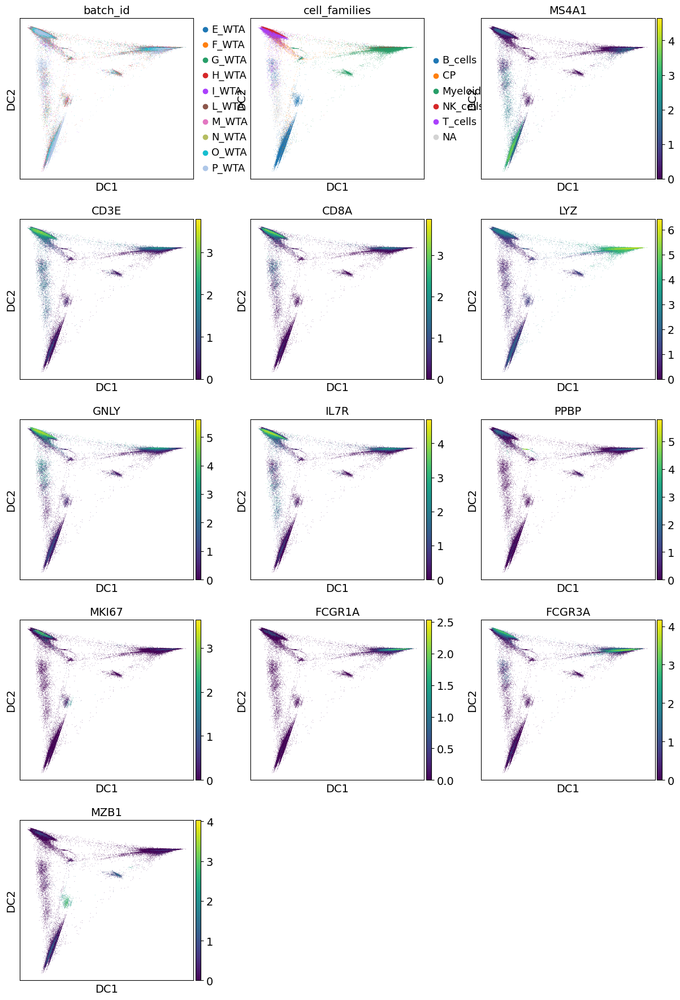

In [100]:
sc.pl.diffmap(adata_geneonly, color=["batch_id", "cell_families"] + gene_markers, ncols=3)

In [101]:
adata.obsm["X_diffmap_genes"] = adata_geneonly.obsm["X_diffmap"][:,1:3]

### diffusion map based on ab-seq only

In [102]:
adata_absonly = adata[:, adata.var_names.str.startswith("ab_")]


In [103]:
adata_absonly = sc.AnnData(X=adata_absonly.X,
                           obs=adata_absonly.obs,
                           var=adata_absonly.var)

In [104]:
sc.pp.neighbors(adata_absonly, use_rep="X")
sc.tl.diffmap(adata_absonly)

computing neighbors
    computing neighbors
    computed neighbors (0:05:43)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:05:47)
computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` 
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9972967  0.9966006  0.99467206 0.99296796 0.9925923
     0.9919967  0.9871492  0.98553056 0.9850424  0.98185045 0.9811714
     0.9806892  0.9800274  0.9797149 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:10)


... storing 'leiden_abseq_harmony_new' as categorical
... storing 'cell_type' as categorical
... storing 'cell_families' as categorical


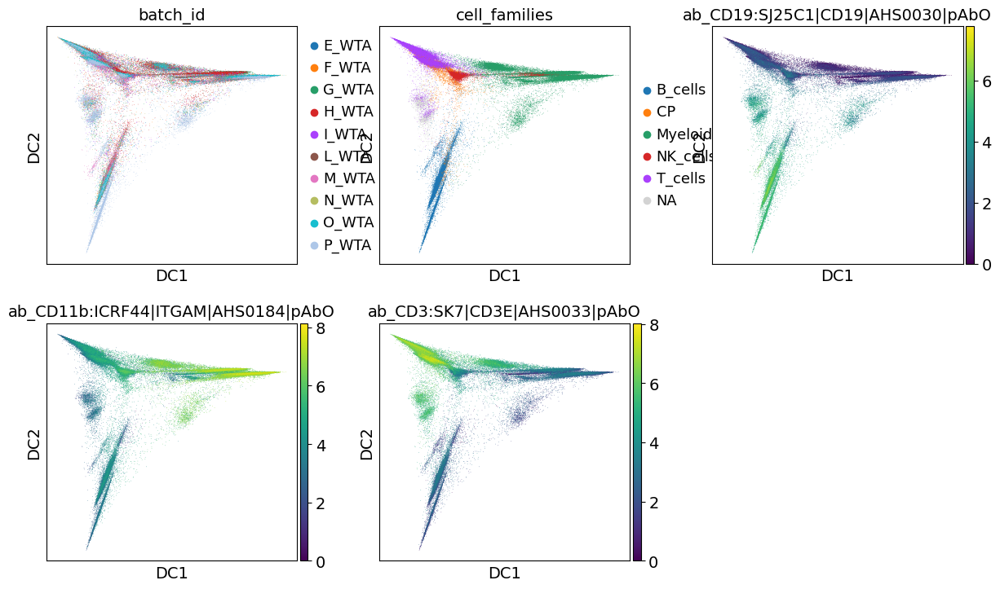

In [105]:
sc.pl.diffmap(adata_absonly, color=["batch_id", "cell_families"] + ab_markers, ncols=3)

In [106]:
adata.obsm["X_diffmap_abseq"] = adata_absonly.obsm["X_diffmap"][:,1:3]

In [107]:
del adata_absonly
del adata_geneonly

## 15) metadata processing and save anndata to disk

define age binning

In [108]:
bins = pd.IntervalIndex.from_tuples(
    [(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), (50, 60), 
     (60, 70), (70, 80), (80, 90), (90, 100), (100, 110)])
adata.obs['age_bin'] = pd.cut(adata.obs.age, bins)
adata.obs['age_bin'] = adata.obs['age_bin'].astype(str).replace(
    {'(20, 30]': '20-30', '(30, 40]': '30-40', '(40, 50]': '40-50', '(50, 60]': '50-60',
     '(60, 70]': '60-70', '(70, 80]': '70-80', '(80, 90]': '80-90', '(90, 100]': '90-100'})

create numeric codes for severity, sex and time

In [109]:
adata.obs['severity_code'] = adata.obs['severity'].cat.as_ordered().cat.reorder_categories(
    ['control', 'mild', 'moderate', 'severe', 'critical']).cat.codes

In [110]:
adata.obs['sex_code'] = adata.obs['sex'].cat.as_ordered().cat.reorder_categories(
    ['F', 'M']).cat.codes

In [111]:
adata.obs['time_code'] = adata.obs['time'].cat.as_ordered().cat.reorder_categories(
    ['control', 'admission', 'discharge', 'post-1mo']).cat.codes

visualize matrixplot for severity, time and age

... storing 'leiden_abseq_harmony_new' as categorical
... storing 'cell_type' as categorical
... storing 'cell_families' as categorical
... storing 'age_bin' as categorical


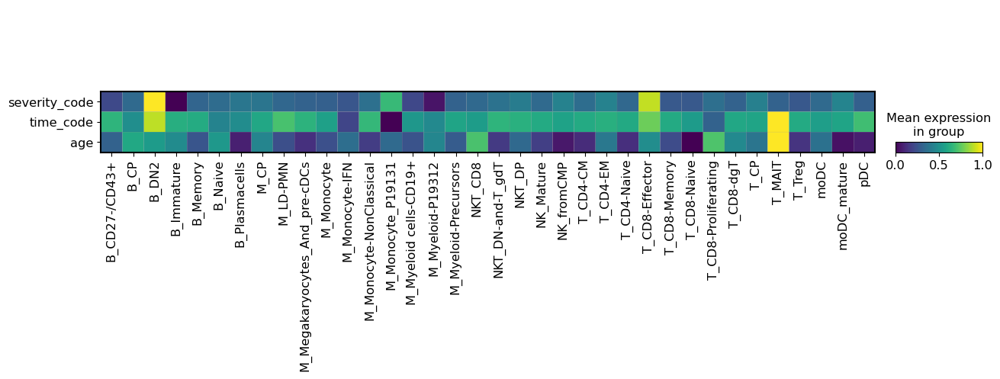

In [112]:
sc.pl.matrixplot(adata, ['severity_code', 'time_code', 'age'], standard_scale='var', dendrogram=False,
                 groupby=['cell_type'], swap_axes=True, num_categories=5)

add a new "coarse" severity annotation, by grouping severe and critical patients

In [113]:
adata.obs["severity_coarse"] = adata.obs["severity"].replace(
    {"severe": "sev+cri", "critical": "sev+cri"}).astype('str')

show some info on patients

In [114]:
patients_table = adata.obs[['patient', 'sample_tag', 'lab_id', 'sex', 'severity', 'time', 'batch_id']].groupby('sample_tag', as_index=False).agg(lambda x: ''.join((x.unique())))
patients_table

,sample_tag,patient,lab_id,sex,severity,time,batch_id
0,E_WTA-SampleTag01_hs,P-19501,P0055,M,mild,admission,E_WTA
1,E_WTA-SampleTag02_hs,P-19501,P0080,M,mild,discharge,E_WTA
2,E_WTA-SampleTag03_hs,P-19501,P0103,M,mild,post-1mo,E_WTA
3,E_WTA-SampleTag04_hs,P-19131,P0039,F,severe,admission,E_WTA
4,E_WTA-SampleTag05_hs,P-19131,P0104,F,severe,post-1mo,E_WTA
5,E_WTA-SampleTag06_hs,P-crtl,ctrl,F,control,control,E_WTA
6,F_WTA-SampleTag07_hs,P-20368,P0071,M,mild,admission,F_WTA
7,F_WTA-SampleTag08_hs,P-20368,P0087,M,mild,discharge,F_WTA
8,F_WTA-SampleTag09_hs,P-20368,P0107,M,mild,post-1mo,F_WTA
9,F_WTA-SampleTag10_hs,P-19777,P0057,M,moderate,admission,F_WTA


In [115]:
print("total number of patients: {}".format(len(patients_table['patient'].unique())))
print("- mild cases: {}".format(len(patients_table[patients_table.severity == "mild"]['patient'].unique())))
print("- moderate cases: {}".format(len(patients_table[patients_table.severity == "moderate"]['patient'].unique())))
print("- severe cases: {}".format(len(patients_table[patients_table.severity == "severe"]['patient'].unique())))
print("- critical cases: {}".format(len(patients_table[patients_table.severity == "critical"]['patient'].unique())))
print("- control: {}".format(len(patients_table[patients_table.severity == "control"]['patient'].unique())))

total number of patients: 21
- mild cases: 10
- moderate cases: 3
- severe cases: 4
- critical cases: 3
- control: 1


### save dataset

In [116]:
outfilename = os.path.join(data_folder, "complete-gex-dataset-annotated.h5ad")
print("Saving h5ad data to file {}".format(outfilename))
adata.write(outfilename)
print("Done!")

... storing 'severity_coarse' as categorical


Saving h5ad data to file ../data/complete-gex-dataset-annotated.h5ad
Done!


In [117]:
#dataset_name = "complete-gex-dataset-annotated.h5ad"
#adata = sc.read_h5ad(os.path.join(data_folder, dataset_name))
#adata

## 16) Statistics on cell abundance variations across samples

prepare files that are needed by the Rmarkdown code for the statistics analysis

prepare file with the cell families counts for each patients

In [118]:
table = adata.obs.copy()
table['patient_time'] = table["patient"].astype(str) + "_" + table["time"].astype(str)

In [119]:
cell_families_table = pd.crosstab(table['cell_families'], table['patient_time']).drop("P-crtl_control", axis=1)
cell_families_table

patient_time,P-16483_admission,P-16483_discharge,P-16483_post-1mo,P-17531_admission,P-17531_discharge,P-17531_post-1mo,P-17788_admission,P-17788_discharge,P-17788_post-1mo,P-18066_admission,...,P-20368_admission,P-20368_discharge,P-20368_post-1mo,P-20386_admission,P-20386_discharge,P-20386_post-1mo,P-20576_admission,P-20576_discharge,P-20576_post-1mo,P-20741_admission
cell_families,,,,,,,,,,,,,,,,,,,,,
B_cells,258,367,116,115,140,128,358,106,304,366,...,97,140,211,90,440,143,68,82,148,1947
CP,44,72,22,74,75,77,46,19,31,15,...,17,16,21,268,81,88,16,88,54,82
Myeloid_cells,1138,1681,688,450,1150,702,952,620,909,1061,...,294,182,617,493,1546,872,1179,553,1620,4
NK_cells,278,392,279,334,364,496,236,152,151,319,...,44,155,289,99,757,599,83,14,245,10
T_cells,999,1614,1161,1088,1158,1052,1350,394,1001,639,...,254,518,766,384,1735,971,374,208,858,35


prepare file with the cell type counts for each patients

In [120]:
cell_type_table = pd.crosstab(table['cell_type'], table['patient_time']).drop("P-crtl_control", axis=1)
cell_type_table.head()

patient_time,P-16483_admission,P-16483_discharge,P-16483_post-1mo,P-17531_admission,P-17531_discharge,P-17531_post-1mo,P-17788_admission,P-17788_discharge,P-17788_post-1mo,P-18066_admission,...,P-20368_admission,P-20368_discharge,P-20368_post-1mo,P-20386_admission,P-20386_discharge,P-20386_post-1mo,P-20576_admission,P-20576_discharge,P-20576_post-1mo,P-20741_admission
cell_type,,,,,,,,,,,,,,,,,,,,,
B_CD27-/CD43+,8,12,4,10,5,13,3,3,5,5,...,3,3,5,4,33,14,0,2,2,7
B_CP,4,9,3,9,6,5,10,3,7,3,...,4,2,7,23,8,6,2,7,2,81
B_DN2,2,3,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_Immature,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_Memory,151,209,55,27,30,32,70,25,68,94,...,21,32,63,13,150,49,5,15,44,4


prepare a metadata table

In [121]:
metadata_table = table[['patient_time','severity', 'time']].groupby('patient_time', as_index=False).agg(lambda x: ''.join(x.unique()))
metadata_table = metadata_table[metadata_table.time != "control"]
metadata_table.head()

,patient_time,severity,time
0,P-16483_admission,severe,admission
1,P-16483_discharge,severe,discharge
2,P-16483_post-1mo,severe,post-1mo
3,P-17531_admission,severe,admission
4,P-17531_discharge,severe,discharge


save these tables to disk to process them with the Rmarkdown script

In [122]:
cell_families_table.to_csv(os.path.join(result_folder, "cell_family_vs_patient_time.csv"))
cell_type_table.to_csv(os.path.join(result_folder, "cell_type_vs_patient_time.csv"))
metadata_table.to_csv(os.path.join(result_folder, "patient_time_metadata.csv"))

In [123]:
del table
del cell_families_table
del cell_type_table
del metadata_table

### Render rmarkdown notebook - cell families

In [124]:
!R -e "rmarkdown::render('02_abundance_analysis.Rmd', output_file='02_abundance_analysis_cell_families.html', params = list(input_table = '../Result/cell_family_vs_patient_time.csv', metadata = '../Result/patient_time_metadata.csv', output_folder = '../Result/diff_abundance'))"


R version 4.1.3 (2022-03-10) -- "One Push-Up"
Copyright (C) 2022 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

  Natural language support but running in an English locale

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> rmarkdown::render('02_abundance_analysis.Rmd', output_file='02_abundance_analysis_cell_families.html', params = list(input_table = '../Result/cell_family_vs_patient_time.csv', metadata = '../Result/patient_time_metadata.csv', output_folder = '../Result/diff_abundance'))


processing file: 02_abundance_analysis

### Results - cell families

#### aggregated results

change in cell types abundance across severity, abundances aggregated for all time points

**only showing changes with p value < 0.05**

In [125]:
file_list = ["Severitycritical_vs_Severitymoderate.tsv",
             "Severitysevere+critical_vs_Severitymoderate.tsv",
             "Severitymild_vs_Severitycritical.tsv",
             "Severitysevere_vs_Severitycritical.tsv",
             "Severitymild_vs_Severitymoderate.tsv",
             "Severitysevere_vs_Severitymild.tsv",
             "Severitysevere+critical_vs_Severitymild.tsv",
             "Severitysevere_vs_Severitymoderate.tsv",]

In [126]:
df = pd.DataFrame([], columns=['B_cells', 'Myeloid_cells', 'T_cells', 'CP', 'NK_cells'])

for f_name in file_list:
    conditions = re.match("Severity(.*)_vs_Severity(.*).tsv", f_name).group(1,2)
    table = pd.read_csv(os.path.join(result_folder, "diff_abundance", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} vs {}".format(*conditions)))
    significant = table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**critical vs moderate**

                  logFC     logCPM         F    PValue       FDR
B_cells        1.486510  16.769824  7.992248  0.006301  0.031503
Myeloid_cells -1.111914  18.522950  5.672741  0.020284  0.050711




**severe+critical vs moderate**

no significant change




**mild vs critical**

                  logFC     logCPM         F    PValue       FDR
Myeloid_cells  1.055739  18.522950  6.680007  0.012095  0.060475
T_cells       -0.531348  18.556663  4.346215  0.041178  0.102945




**severe vs critical**

             logFC     logCPM         F    PValue       FDR
B_cells  -1.461686  16.769824  8.785765  0.004291  0.021453
NK_cells  0.839699  16.610200  4.580326  0.036246  0.090616




**mild vs moderate**

no significant change




**severe vs mild**

            logFC     logCPM         F    PValue       FDR
CP       0.839425  14.769647  5.087892  0.027599  0.110061
B_cells -0.786664  16.769824  4.224467  0.044024  0.110061




**severe+critical vs mild**

       logFC     logCPM         F    PValue       FDR
CP  0.793268  14.771215  6.088987  0.016337  0.081683




**severe vs moderate**

             logFC   logCPM         F    PValue       FDR
NK_cells  0.840404  16.6102  5.351739  0.024001  0.120005




In [127]:
df

,B_cells,Myeloid_cells,T_cells,CP,NK_cells
critical vs moderate,0.006301,0.020284,0.290080,0.765811,0.998618
severe+critical vs moderate,0.104078,0.146653,0.543388,0.609187,0.101973
mild vs critical,0.109151,0.012095,0.041178,0.110231,0.209682
severe vs critical,0.004291,0.065200,0.314934,0.817515,0.036246
mild vs moderate,0.073264,0.872959,0.419018,0.199406,0.180278
severe vs mild,0.044024,0.502862,0.309025,0.027599,0.141255
severe+critical vs mild,0.909700,0.085191,0.063486,0.016337,0.579583
severe vs moderate,0.958132,0.503077,0.911393,0.568952,0.024001


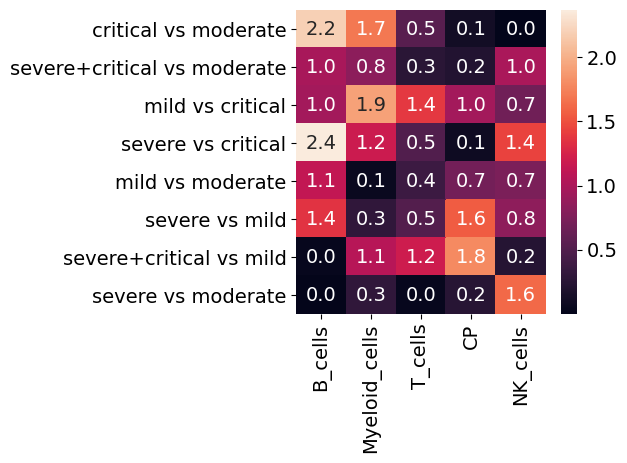

In [128]:
log_df = -np.log10(df)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f")

#### difference across severities at specific time points

change in cell types abundance across severity, abundances at specific time points

**only showing changes with p value < 0.05**

In [129]:
file_list = [
    "admission_Severitymild_vs_Severitymoderate.tsv",
    "admission_Severitysevere+critical_vs_Severitymild.tsv",
    "admission_Severitysevere+critical_vs_Severitymoderate.tsv",
    "discharge_Severitymild_vs_Severitymoderate.tsv",
    "discharge_Severitysevere+critical_vs_Severitymild.tsv",
    "discharge_Severitysevere+critical_vs_Severitymoderate.tsv",
    "post-1mo_Severitymild_vs_Severitymoderate.tsv",
    "post-1mo_Severitysevere+critical_vs_Severitymild.tsv",
    "post-1mo_Severitysevere+critical_vs_Severitymoderate.tsv",
]

In [130]:
df = pd.DataFrame([], columns=['B_cells', 'Myeloid_cells', 'T_cells', 'CP', 'NK_cells'])

for f_name in file_list:
    conditions = re.match("(.*)_Severity(.*)_vs_Severity(.*).tsv", f_name).group(1,2,3)
    table = pd.read_csv(os.path.join(result_folder, "diff_abundance", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} - {} vs {}".format(*conditions)))
    significant = table # table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} - {} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**admission - mild vs moderate**

                  logFC     logCPM         F    PValue       FDR
CP            -1.482332  15.072556  3.799062  0.054579  0.272896
B_cells        1.009946  17.057601  1.681810  0.198194  0.495484
T_cells       -0.172827  18.486871  0.059161  0.808413  0.960640
NK_cells       0.104278  16.565522  0.020299  0.887041  0.960640
Myeloid_cells  0.035606  18.485456  0.002450  0.960640  0.960640




**admission - severe+critical vs mild**

                  logFC     logCPM          F    PValue       FDR
CP             1.733243  15.072556  10.322028  0.001858  0.009288
B_cells        0.877727  17.057601   2.756169  0.100565  0.251412
Myeloid_cells -0.786476  18.485456   2.084443  0.152482  0.254137
T_cells        0.235549  18.486871   0.196771  0.658467  0.781424
NK_cells      -0.149472  16.565522   0.077475  0.781424  0.781424




**admission - severe+critical vs moderate**

                  logFC     logCPM         F    PValue       FDR
B_cells        1.887673  17.057601  4.996583  0.028019  0.140095
Myeloid_cells -0.750870  18.485456  1.056517  0.306927  0.767318
CP             0.250911  15.072556  0.090032  0.764869  0.952711
T_cells        0.062722  18.486871  0.006915  0.933922  0.952711
NK_cells      -0.045194  16.565522  0.003538  0.952711  0.952711




**discharge - mild vs moderate**

                  logFC     logCPM         F    PValue       FDR
NK_cells       1.289776  16.488169  5.199303  0.033196  0.165981
B_cells        0.399760  16.694097  0.330396  0.571560  0.867426
Myeloid_cells -0.219669  18.668769  0.208117  0.652951  0.867426
T_cells       -0.086604  18.460038  0.051383  0.822875  0.867426
CP             0.129024  14.701413  0.028559  0.867426  0.867426




**discharge - severe+critical vs mild**

                  logFC     logCPM         F    PValue       FDR
T_cells        0.526169  18.460038  2.811139  0.108503  0.278513
B_cells       -0.976917  16.694097  2.762742  0.111405  0.278513
Myeloid_cells -0.333705  18.668769  0.657540  0.426565  0.710942
NK_cells       0.208121  16.488169  0.238086  0.630670  0.788338
CP            -0.165140  14.701413  0.068454  0.796162  0.796162




**discharge - severe+critical vs moderate**

                  logFC     logCPM         F    PValue       FDR
NK_cells       1.497897  16.488169  6.020378  0.023002  0.115009
Myeloid_cells -0.553374  18.668769  1.073231  0.312052  0.534252
T_cells        0.439566  18.460038  1.035289  0.320551  0.534252
B_cells       -0.577157  16.694097  0.604837  0.445451  0.556814
CP            -0.036116  14.701413  0.001871  0.965907  0.965907




**post-1mo - mild vs moderate**

                  logFC     logCPM         F    PValue       FDR
B_cells        1.239888  16.474146  4.157528  0.054217  0.271086
CP            -0.520266  14.507697  1.175427  0.290564  0.524856
T_cells       -0.291664  18.708411  1.059998  0.314913  0.524856
NK_cells       0.204427  16.756368  0.208650  0.652511  0.815639
Myeloid_cells  0.043675  18.412574  0.005744  0.940304  0.940304




**post-1mo - severe+critical vs mild**

                  logFC     logCPM         F    PValue       FDR
B_cells       -1.035509  16.474146  5.161617  0.033709  0.168545
T_cells        0.325781  18.708411  2.109287  0.161167  0.402917
CP             0.406928  14.507697  1.114703  0.303042  0.413299
NK_cells       0.341647  16.756368  0.991741  0.330640  0.413299
Myeloid_cells -0.296600  18.412574  0.424660  0.521680  0.521680




**post-1mo - severe+critical vs moderate**

                  logFC     logCPM         F    PValue       FDR
NK_cells       0.546073  16.756368  1.266278  0.273147  0.913431
Myeloid_cells -0.252925  18.412574  0.170896  0.683502  0.913431
B_cells        0.204380  16.474146  0.112656  0.740466  0.913431
CP            -0.113338  14.507697  0.046308  0.831691  0.913431
T_cells        0.034116  18.708411  0.012106  0.913431  0.913431




In [131]:
df

,B_cells,Myeloid_cells,T_cells,CP,NK_cells
admission - mild vs moderate,0.198194,0.960640,0.808413,0.054579,0.887041
admission - severe+critical vs mild,0.100565,0.152482,0.658467,0.001858,0.781424
admission - severe+critical vs moderate,0.028019,0.306927,0.933922,0.764869,0.952711
discharge - mild vs moderate,0.571560,0.652951,0.822875,0.867426,0.033196
discharge - severe+critical vs mild,0.111405,0.426565,0.108503,0.796162,0.630670
discharge - severe+critical vs moderate,0.445451,0.312052,0.320551,0.965907,0.023002
post-1mo - mild vs moderate,0.054217,0.940304,0.314913,0.290564,0.652511
post-1mo - severe+critical vs mild,0.033709,0.521680,0.161167,0.303042,0.330640
post-1mo - severe+critical vs moderate,0.740466,0.683502,0.913431,0.831691,0.273147


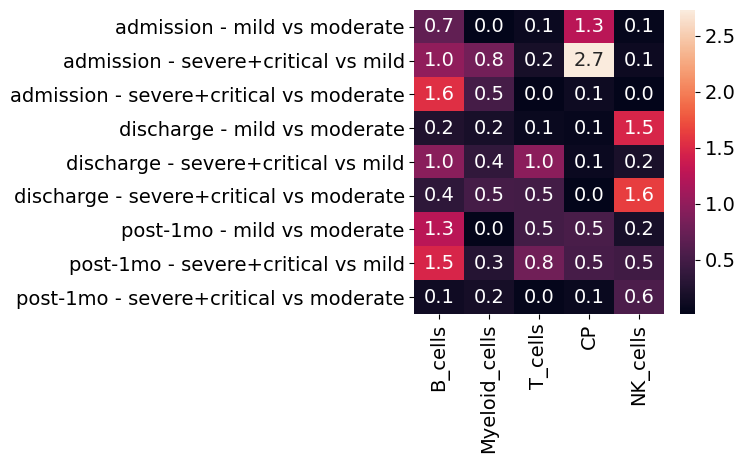

In [132]:
log_df = -np.log10(df)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f")

#### difference across time points for patients of given severity

change in cell types abundance across severity, abundances at specific time points

**only showing changes with p value < 0.05**

In [133]:
file_list = [
    "mild_timeadmission_vs_timedischarge.tsv",
    "mild_timeadmission_vs_timepost-1mo.tsv",
    "mild_timedischarge_vs_timepost-1mo.tsv",
    "moderate_timeadmission_vs_timedischarge.tsv",
    "moderate_timeadmission_vs_timepost-1mo.tsv",
    "moderate_timedischarge_vs_timepost-1mo.tsv",
    "severe+critical_timeadmission_vs_timedischarge.tsv",
    "severe+critical_timeadmission_vs_timepost-1mo.tsv",
    "severe+critical_timedischarge_vs_timepost-1mo.tsv",
]

In [134]:
df = pd.DataFrame([], columns=['B_cells', 'Myeloid_cells', 'T_cells',  'CP', 'NK_cells'])

for f_name in file_list:
    conditions = re.match("(.*)_time(.*)_vs_time(.*).tsv", f_name).group(1,2,3)
    table = pd.read_csv(os.path.join(result_folder, "diff_abundance", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} - {} vs {}".format(*conditions)))
    significant = table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} - {} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**mild - admission vs discharge**

no significant change




**mild - admission vs post-1mo**

no significant change




**mild - discharge vs post-1mo**

no significant change




**moderate - admission vs discharge**

no significant change




**moderate - admission vs post-1mo**

no significant change




**moderate - discharge vs post-1mo**

no significant change




**severe+critical - admission vs discharge**

            logFC     logCPM         F    PValue       FDR
B_cells  1.649063  16.844041  5.462836  0.024549  0.122744




**severe+critical - admission vs post-1mo**

            logFC     logCPM         F    PValue       FDR
B_cells  1.790994  16.844041  7.265244  0.010253  0.051265




**severe+critical - discharge vs post-1mo**

no significant change




In [135]:
df

,B_cells,Myeloid_cells,T_cells,CP,NK_cells
mild - admission vs discharge,0.511441,0.966484,0.615757,0.153448,0.838130
mild - admission vs post-1mo,0.695337,0.289294,0.349322,0.632711,0.899965
mild - discharge vs post-1mo,0.788752,0.308431,0.155363,0.326279,0.741659
moderate - admission vs discharge,0.575943,0.513708,0.657774,0.301877,0.149750
moderate - admission vs post-1mo,0.940713,0.554402,0.473312,0.384296,0.938866
moderate - discharge vs post-1mo,0.522659,0.227853,0.258023,0.845146,0.163523
severe+critical - admission vs discharge,0.024549,0.574622,0.751480,0.092610,0.632904
severe+critical - admission vs post-1mo,0.010253,0.715358,0.651324,0.092810,0.374017
severe+critical - discharge vs post-1mo,0.838413,0.837056,0.912659,0.915920,0.719895


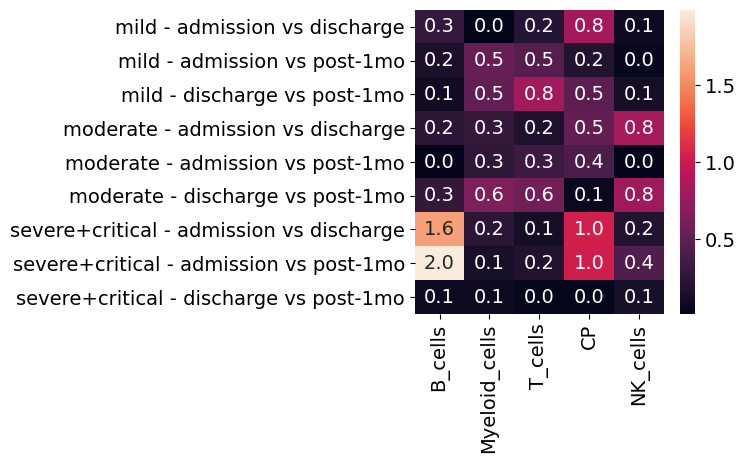

In [136]:
log_df = -np.log10(df)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f")

### Render rmarkdown notebook - cell clusters

In [137]:
!R -e "rmarkdown::render('02_abundance_analysis.Rmd', output_file='02_abundance_analysis_cell_type.html', params = list(input_table = '../Result/cell_type_vs_patient_time.csv', metadata = '../Result/patient_time_metadata.csv', output_folder = '../Result/diff_abundance_clusters'))"


R version 4.1.3 (2022-03-10) -- "One Push-Up"
Copyright (C) 2022 The R Foundation for Statistical Computing
Platform: x86_64-pc-linux-gnu (64-bit)

R is free software and comes with ABSOLUTELY NO WARRANTY.
You are welcome to redistribute it under certain conditions.
Type 'license()' or 'licence()' for distribution details.

  Natural language support but running in an English locale

R is a collaborative project with many contributors.
Type 'contributors()' for more information and
'citation()' on how to cite R or R packages in publications.

Type 'demo()' for some demos, 'help()' for on-line help, or
'help.start()' for an HTML browser interface to help.
Type 'q()' to quit R.

> rmarkdown::render('02_abundance_analysis.Rmd', output_file='02_abundance_analysis_cell_type.html', params = list(input_table = '../Result/cell_type_vs_patient_time.csv', metadata = '../Result/patient_time_metadata.csv', output_folder = '../Result/diff_abundance_clusters'))


processing file: 02_abundance_analy

### Results - cell microclusters

#### aggregated results

change in cell types abundance across severity, abundances aggregated for all time points

**only showing changes with p value < 0.05**

In [138]:
file_list = ["Severitycritical_vs_Severitymoderate.tsv",
             "Severitysevere+critical_vs_Severitymoderate.tsv",
             "Severitymild_vs_Severitycritical.tsv",
             "Severitysevere_vs_Severitycritical.tsv",
             "Severitymild_vs_Severitymoderate.tsv",
             "Severitysevere_vs_Severitymild.tsv",
             "Severitysevere+critical_vs_Severitymild.tsv",
             "Severitysevere_vs_Severitymoderate.tsv",]

In [139]:
df = pd.DataFrame([])

for f_name in file_list:
    conditions = re.match("Severity(.*)_vs_Severity(.*).tsv", f_name).group(1,2)
    table = pd.read_csv(os.path.join(result_folder, "diff_abundance_clusters", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} vs {}".format(*conditions)))
    significant = table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**critical vs moderate**

                         logFC     logCPM          F    PValue       FDR
T_CD8-Effector        6.396700  14.699222  22.752385  0.000013  0.000479
B_DN2                 7.735261  11.036494  20.005552  0.000254  0.004566
T_MAIT               -6.891503  13.793512  13.226165  0.000600  0.007203
B_Naive               2.273724  16.181518  12.015740  0.001013  0.009116
M_Myeloid-Precursors -1.861289  15.866105   7.956099  0.006593  0.047472
T_CD8-Proliferating  -2.457578  13.009860   5.777333  0.019527  0.117163
M_CP                 -1.824158  11.222922   5.086926  0.027984  0.140794
M_Monocyte           -1.295631  17.633264   4.876277  0.031288  0.140794




**severe+critical vs moderate**

                         logFC     logCPM          F        PValue       FDR
T_MAIT               -7.062098  13.797857  31.677750  5.830632e-07  0.000021
T_CD8-Proliferating  -2.817408  13.010130  14.317500  3.706583e-04  0.006672
T_CD8-Effector        4.997837  14.700644  10.226805  2.262719e-03  0.027153
T_CD8-dgT             2.960997  15.233324   9.033985  3.924542e-03  0.035321
B_DN2                 6.355265  11.041931   8.530615  8.495416e-03  0.061167
M_Monocyte_P19131     7.879167  12.167866   7.226701  1.419194e-02  0.085152
NKT_DN-and-T_gdT      1.073214  14.044753   5.983974  1.752091e-02  0.090108
B_Naive               1.397699  16.181319   5.335204  2.451416e-02  0.110314
M_Myeloid-Precursors -1.084571  15.867355   4.614800  3.592709e-02  0.139165
T_CD4-EM              0.965980  15.164431   4.479089  3.865690e-02  0.139165
M_Monocyte-IFN       -2.325122  11.839482   4.015275  4.986268e-02  0.163187




**mild vs critical**

                          logFC     logCPM          F        PValue  \
T_CD8-Effector        -5.732597  14.699222  59.580933  2.081960e-10   
B_DN2                 -7.735261  11.036494  55.275554  4.518063e-07   
T_CD8-dgT              4.414398  15.233681  19.287462  4.970498e-05   
M_Myeloid-P19312       6.394173  12.885394  11.130548  1.509235e-03   
B_Immature             6.060977  11.354989   6.437972  1.620227e-02   
M_Myeloid-Precursors   1.394222  15.866105   5.923932  1.811057e-02   
M_Monocyte             1.257413  17.633264   5.879520  1.852779e-02   
B_CD27-/CD43+          1.758616  12.266580   5.448799  2.314855e-02   
T_CD4-EM              -0.981861  15.164812   5.383985  2.394416e-02   
M_Myeloid cells-CD19+  1.787806  13.429528   4.651151  3.528699e-02   
T_CD8-Memory           0.912085  14.453743   4.424584  3.987318e-02   

                                FDR  
T_CD8-Effector         7.495056e-09  
B_DN2                  8.132514e-06  
T_CD8-dgT              5.964597e-

**severe vs critical**

                      logFC     logCPM          F        PValue       FDR
T_CD8-Effector    -7.090113  14.699222  36.376701  1.299451e-07  0.000005
T_CD8-dgT          5.314295  15.233681  23.787165  9.087785e-06  0.000164
B_DN2             -5.468654  11.036494  17.385635  5.080767e-04  0.006097
B_Naive           -1.976703  16.181518  10.522299  1.979352e-03  0.017814
M_Monocyte_P19131  8.592051  12.164120   7.019421  1.978085e-02  0.142422
NK_Mature          0.884059  16.510337   4.537338  3.751531e-02  0.216773
M_Myeloid-P19312   3.822977  12.885394   4.323962  4.215022e-02  0.216773




**mild vs moderate**

                          logFC     logCPM          F    PValue       FDR
T_MAIT                -4.566693  13.797857  23.496055  0.000010  0.000362
B_CD27-/CD43+          2.184324  12.266312   8.828870  0.004324  0.047169
M_CP                  -1.626615  11.222500   8.456432  0.005163  0.047169
T_CD8-dgT              2.746159  15.233324   8.425116  0.005241  0.047169
T_CD8-Proliferating   -1.857190  13.010130   7.918939  0.006688  0.048152
M_Myeloid-P19312       4.235509  12.885217   7.413422  0.008581  0.051485
B_Immature             6.061355  11.355836   7.361981  0.010655  0.054798
B_Naive                1.376581  16.181319   5.672238  0.020570  0.089654
M_Myeloid cells-CD19+  1.782445  13.429039   5.506854  0.022414  0.089654




**severe vs mild**

                          logFC     logCPM          F    PValue       FDR
M_Monocyte_P19131      8.592051  12.164120  24.639589  0.000245  0.008828
B_Immature            -6.060977  11.354989   9.765621  0.003747  0.067455
T_CP                   1.107180  14.436125   6.802476  0.011616  0.120074
T_CD4-EM               0.926998  15.164812   6.525984  0.013342  0.120074
M_Myeloid-P19312      -2.571196  12.885394   5.046448  0.028621  0.136015
B_Naive               -1.077394  16.181518   5.043754  0.028629  0.136015
B_DN2                  2.266608  11.036494   5.491074  0.029998  0.136015
M_Myeloid cells-CD19+ -1.489603  13.429528   4.941278  0.030226  0.136015
T_MAIT                -2.606919  13.793512   4.653141  0.035285  0.141138
NKT_DP                 0.675479  14.257339   4.432882  0.039694  0.142900




**severe+critical vs mild**

                          logFC     logCPM          F    PValue       FDR
T_CD8-Effector         4.383598  14.700644  28.502047  0.000002  0.000061
B_DN2                  6.355265  11.041931  25.061367  0.000069  0.001244
M_Monocyte_P19131      7.879167  12.167866  22.419417  0.000129  0.001548
B_Immature            -6.061355  11.355836  15.457115  0.000427  0.003840
M_Myeloid-P19312      -3.213612  12.885217  10.197120  0.002294  0.016515
T_CD4-EM               0.948513  15.164431   9.202427  0.003625  0.021752
M_Myeloid cells-CD19+ -1.601456  13.429039   8.451758  0.005175  0.026613
T_CP                   1.007991  14.438321   7.477745  0.008292  0.037316
T_MAIT                -2.495405  13.797857   6.542994  0.013220  0.052881
NKT_DP                 0.628644  14.256887   5.246106  0.025687  0.092472
B_CD27-/CD43+         -1.008407  12.266312   4.243767  0.043935  0.143789




**severe vs moderate**

                        logFC     logCPM          F    PValue       FDR
T_MAIT              -7.175473  13.793512  21.231414  0.000024  0.000857
T_CD8-dgT            3.645157  15.233681  16.687658  0.000140  0.002520
T_CD8-Proliferating -3.110152  13.009860  12.167061  0.000947  0.011369
NKT_DN-and-T_gdT     1.228040  14.045320   6.765025  0.011835  0.095568
M_Monocyte_P19131    8.592051  12.164120   8.161302  0.013273  0.095568
NK_Mature            0.893736  16.510337   5.458824  0.023028  0.138168




In [140]:
df

,B_CD27-/CD43+,B_CP,B_DN2,B_Immature,B_Memory,B_Naive,B_Plasmacells,M_CP,M_LD-PMN,M_Megakaryocytes_And_pre-cDCs,...,T_CD8-Memory,T_CD8-Naive,T_CD8-Proliferating,T_CD8-dgT,T_CP,T_MAIT,T_Treg,moDC,moDC_mature,pDC
critical vs moderate,0.614417,0.074830,2.536565e-04,1.000000,0.507367,0.001013,0.798875,0.027984,0.339670,0.464218,...,0.600535,0.489973,0.019527,0.087039,0.991117,6.002167e-04,0.336432,0.134226,0.567964,0.149963
severe+critical vs moderate,0.112144,0.153964,8.495416e-03,1.000000,0.437485,0.024514,0.970210,0.059874,0.755118,0.579424,...,0.740228,0.380593,0.000371,0.003925,0.769232,5.830632e-07,0.249111,0.170658,0.344309,0.663194
mild vs critical,0.023149,0.486925,4.518063e-07,0.016202,0.805333,0.079670,0.958392,0.776596,0.263350,0.170165,...,0.039873,0.417396,0.472490,0.000050,0.103218,1.180075e-01,0.520239,0.276084,0.567630,0.077172
severe vs critical,0.181047,0.252351,5.080767e-04,1.000000,0.932087,0.001979,0.605462,0.225530,0.283025,0.620243,...,0.219599,0.997820,0.473785,0.000009,0.661165,8.570419e-01,0.999085,0.481610,0.724950,0.109046
mild vs moderate,0.004324,0.134470,1.000000e+00,0.010655,0.531464,0.020570,0.786005,0.005163,0.982216,0.743114,...,0.095800,0.989842,0.006688,0.005241,0.078702,1.006367e-05,0.065583,0.428028,0.885022,0.872263
severe vs mild,0.238302,0.464485,2.999827e-02,0.003747,0.857260,0.028629,0.529652,0.171318,0.921918,0.323853,...,0.355984,0.328391,0.089930,0.123291,0.011616,3.528462e-02,0.442134,0.707046,0.241305,0.980702
severe+critical vs mild,0.043935,0.984211,6.912655e-05,0.000427,0.790010,0.959248,0.679225,0.364072,0.649688,0.141514,...,0.081647,0.242879,0.106992,0.721103,0.008292,1.322013e-02,0.357940,0.395775,0.249307,0.421945
severe vs moderate,0.056559,0.386487,1.346976e-01,1.000000,0.507885,0.610325,0.801012,0.207685,0.928650,0.778147,...,0.451617,0.433180,0.000947,0.000140,0.653419,2.380756e-05,0.289742,0.335563,0.316712,0.903529


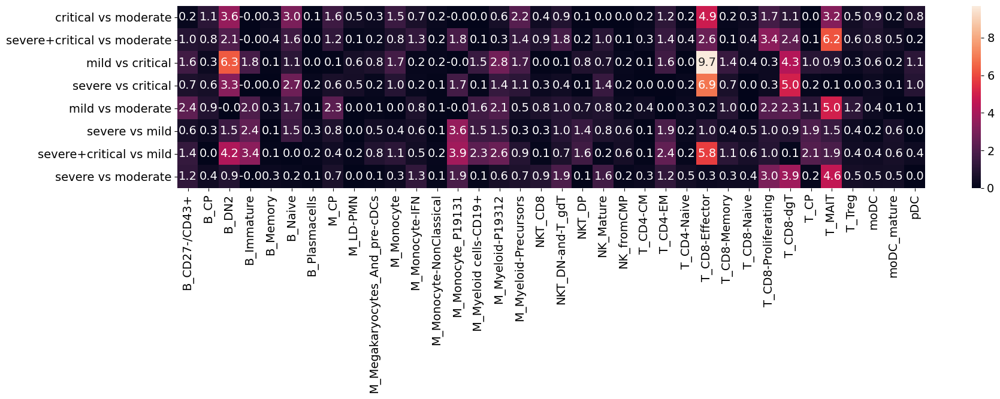

In [141]:
log_df = -np.log10(df)
a4_dims = (20, 4)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f", xticklabels=1, ax=ax)

#### difference across severities at specific time points

change in cell types abundance across severity, abundances at specific time points

**only showing changes with p value < 0.05**

In [142]:
file_list = [
    "admission_Severitymild_vs_Severitymoderate.tsv",
    "admission_Severitysevere+critical_vs_Severitymild.tsv",
    "admission_Severitysevere+critical_vs_Severitymoderate.tsv",
    "discharge_Severitymild_vs_Severitymoderate.tsv",
    "discharge_Severitysevere+critical_vs_Severitymild.tsv",
    "discharge_Severitysevere+critical_vs_Severitymoderate.tsv",
    "post-1mo_Severitymild_vs_Severitymoderate.tsv",
    "post-1mo_Severitysevere+critical_vs_Severitymild.tsv",
    "post-1mo_Severitysevere+critical_vs_Severitymoderate.tsv",
]

In [143]:
df = pd.DataFrame([])

for f_name in file_list:
    conditions = re.match("(.*)_Severity(.*)_vs_Severity(.*).tsv", f_name).group(1,2,3)
    
    if conditions[1] not in ["mild", "severe+critical"] or conditions[2] not in ["mild", "severe+critical"]: continue 

    table = pd.read_csv(os.path.join(result_folder, "diff_abundance_clusters", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} - {} vs {}".format(*conditions)))
    significant = table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} - {} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**admission - severe+critical vs mild**

                          logFC     logCPM          F    PValue       FDR
M_Monocyte_P19131      9.045224  13.570291  12.308665  0.005882  0.115536
T_CD8-Proliferating   -2.618398  13.540129   8.347042  0.008632  0.115536
B_DN2                  6.039325  11.099788  10.070030  0.010260  0.115536
T_CD8-Effector         3.923596  14.476040   7.413998  0.012837  0.115536
T_CP                   1.874840  14.747834   5.957829  0.023356  0.168161
B_Immature            -5.464681  11.181351   5.475382  0.036264  0.217583
M_Myeloid cells-CD19+ -1.982556  13.539561   4.658289  0.042328  0.217685




**discharge - severe+critical vs mild**

                     logFC     logCPM          F    PValue       FDR
T_CD8-Effector    5.333703  14.935464  13.992361  0.001480  0.053296
B_Naive          -1.598455  15.936273   5.714027  0.027540  0.264421
B_Immature       -6.442104  11.534877   6.250062  0.027718  0.264421
B_DN2             5.393404  10.391624   7.333274  0.029731  0.264421
M_Myeloid-P19312 -4.472433  13.454863   4.872303  0.040408  0.264421
M_Monocyte-IFN   -3.746822  11.556071   4.681847  0.044070  0.264421




**post-1mo - severe+critical vs mild**

                   logFC     logCPM          F    PValue       FDR
T_CD8-Effector  4.024468  14.675460   8.613450  0.008693  0.167075
B_Naive        -1.575557  15.704411   7.937285  0.010992  0.167075
B_DN2           7.049207  11.450043  10.229344  0.013923  0.167075
NKT_DP          0.919926  14.523174   4.965094  0.038126  0.318928
B_Immature     -6.192348  11.340654   5.103661  0.044296  0.318928




In [144]:
df

,B_CD27-/CD43+,B_CP,B_DN2,B_Immature,B_Memory,B_Naive,B_Plasmacells,M_CP,M_LD-PMN,M_Megakaryocytes_And_pre-cDCs,...,T_CD8-Memory,T_CD8-Naive,T_CD8-Proliferating,T_CD8-dgT,T_CP,T_MAIT,T_Treg,moDC,moDC_mature,pDC
admission - severe+critical vs mild,0.631603,0.172373,0.010260,0.036264,0.656009,0.166559,0.554292,0.159960,0.614661,0.255308,...,0.247143,0.764517,0.008632,0.949192,0.023356,0.170243,0.351638,0.519660,0.802314,0.154134
discharge - severe+critical vs mild,0.287035,0.116088,0.029731,0.027718,0.900346,0.027540,0.947278,0.610352,0.666386,0.544282,...,0.315747,0.399526,0.424182,0.887078,0.892178,0.166727,0.878670,0.769669,0.178254,0.773483
post-1mo - severe+critical vs mild,0.132928,0.148864,0.013923,0.044296,0.501047,0.010992,0.503180,0.625778,0.932882,0.569948,...,0.515597,0.215258,0.064126,0.709149,0.093821,0.163783,0.629977,0.713539,0.664168,0.600096


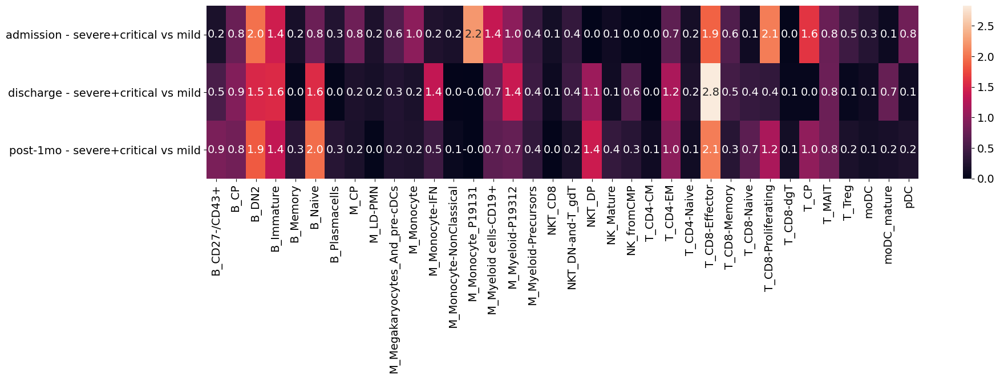

In [145]:
log_df = -np.log10(df)
a4_dims = (20, 4)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f", xticklabels=1, ax=ax)

#### difference across time points for patients of given severity

change in cell types abundance across severity, abundances at specific time points

**only showing changes with p value < 0.05**

In [146]:
file_list = [
    "mild_timeadmission_vs_timedischarge.tsv",
    "mild_timeadmission_vs_timepost-1mo.tsv",
    "mild_timedischarge_vs_timepost-1mo.tsv",
    "moderate_timeadmission_vs_timedischarge.tsv",
    "moderate_timeadmission_vs_timepost-1mo.tsv",
    "moderate_timedischarge_vs_timepost-1mo.tsv",
    "severe+critical_timeadmission_vs_timedischarge.tsv",
    "severe+critical_timeadmission_vs_timepost-1mo.tsv",
    "severe+critical_timedischarge_vs_timepost-1mo.tsv",
]

In [147]:
df = pd.DataFrame([])

for f_name in file_list:
    conditions = re.match("(.*)_time(.*)_vs_time(.*).tsv", f_name).group(1,2,3)
    
    if conditions[0] not in ["mild", "severe+critical"]: continue 
        
    table = pd.read_csv(os.path.join(result_folder, "diff_abundance_clusters", f_name), sep='\t')
    df = df.append(table["PValue"].transpose().rename("{} - {} vs {}".format(*conditions)))
    significant = table[table.PValue <= 0.05]
    print("\n")
    display(Markdown("**" + "{} - {} vs {}".format(*conditions) + "**"))
    if significant.size > 0:
        print(significant)
    else:
        print("no significant change")
        
print("\n")


**mild - admission vs discharge**

                   logFC    logCPM         F    PValue       FDR
M_Monocyte-IFN  2.302181  11.76732  4.256815  0.047906  0.977466




**mild - admission vs post-1mo**

                       logFC     logCPM          F    PValue      FDR
M_Monocyte-IFN       4.23497  11.767320  12.164114  0.001536  0.04299
T_CD8-Proliferating  2.65042  12.743464  11.008200  0.002388  0.04299




**mild - discharge vs post-1mo**

                        logFC     logCPM          F    PValue       FDR
T_CD8-Proliferating  3.136947  12.743464  15.230482  0.000500  0.017985
B_Plasmacells        1.812316  12.373133   7.927710  0.008527  0.153484




**severe+critical - admission vs discharge**

                        logFC     logCPM          F    PValue       FDR
M_Monocyte-IFN       5.330224  11.042315  11.653956  0.002775  0.099890
B_CP                 2.480709  12.475266   8.502500  0.008590  0.154615
B_Naive              2.604342  16.338576   7.388901  0.013295  0.159537
T_CD8-Proliferating -2.293188  11.859213   5.993715  0.023782  0.182959
M_Monocyte_P19131    9.470219  13.648655   7.095966  0.025411  0.182959
B_Plasmacells       -1.233445  12.156908   4.429235  0.048273  0.289637




**severe+critical - admission vs post-1mo**

                      logFC     logCPM          F    PValue       FDR
M_Monocyte-IFN     4.558595  11.042315  10.253013  0.004506  0.089557
B_Naive            2.702861  16.338576   9.104896  0.006843  0.089557
B_CP               2.363378  12.475266   8.873135  0.007463  0.089557
M_Monocyte_P19131  9.470219  13.648655   7.687497  0.021226  0.191037




**severe+critical - discharge vs post-1mo**

                  logFC     logCPM          F    PValue       FDR
B_Plasmacells  2.183947  12.156908  12.284859  0.002249  0.080954




In [148]:
df

,B_CD27-/CD43+,B_CP,B_DN2,B_Immature,B_Memory,B_Naive,B_Plasmacells,M_CP,M_LD-PMN,M_Megakaryocytes_And_pre-cDCs,...,T_CD8-Memory,T_CD8-Naive,T_CD8-Proliferating,T_CD8-dgT,T_CP,T_MAIT,T_Treg,moDC,moDC_mature,pDC
mild - admission vs discharge,0.446937,0.424056,1.000000,0.678807,0.412229,0.868782,0.220066,0.430424,0.054304,0.115328,...,0.813971,0.304435,0.512298,0.799653,0.159242,0.275793,0.567963,0.757094,0.750339,0.629620
mild - admission vs post-1mo,0.232591,0.835943,1.000000,0.782242,0.267405,0.839933,0.114168,0.288489,0.053607,0.424178,...,0.787050,0.895236,0.002388,0.875015,0.692071,0.201568,0.547539,0.632781,0.991852,0.471136
mild - discharge vs post-1mo,0.653602,0.547165,1.000000,0.889149,0.767066,0.713738,0.008527,0.800310,0.995461,0.419312,...,0.613797,0.368202,0.000500,0.681590,0.300995,0.861561,0.247579,0.866542,0.742362,0.237006
severe+critical - admission vs discharge,0.908558,0.008590,0.655839,1.000000,0.939148,0.013295,0.048273,0.829044,0.125470,0.297723,...,0.883592,0.387878,0.023782,0.940885,0.264378,0.299748,0.826695,0.845798,0.633940,0.235379
severe+critical - admission vs post-1mo,0.969842,0.007463,0.718339,1.000000,0.861316,0.006843,0.119026,0.417874,0.057367,0.446904,...,0.376769,0.566967,0.148101,0.769902,0.286389,0.225221,0.295664,0.934135,0.960919,0.168870
severe+critical - discharge vs post-1mo,0.938896,0.887376,0.440661,1.000000,0.813736,0.913678,0.002249,0.564560,0.718591,0.757027,...,0.501738,0.743929,0.331428,0.735817,0.905913,0.873840,0.443981,0.911046,0.678858,0.875985


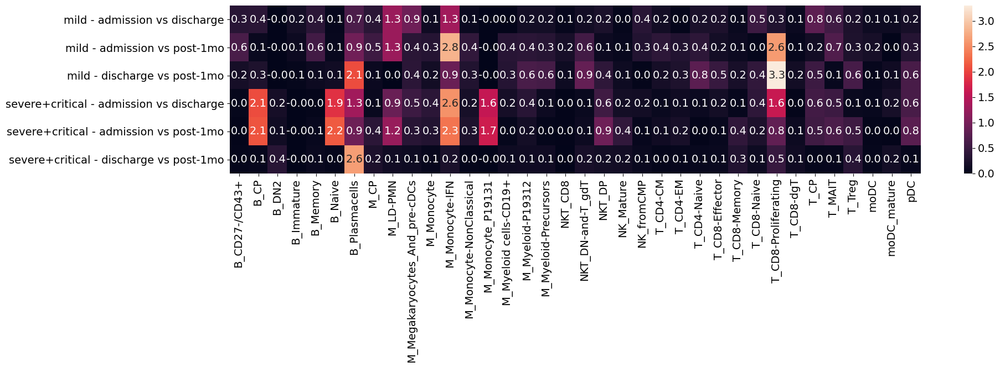

In [149]:
log_df = -np.log10(df)
a4_dims = (20, 4)
fig, ax = plt.subplots(figsize=a4_dims)
ax = sns.heatmap(log_df, annot=True, fmt="0.1f", xticklabels=1, ax=ax)

## 17) Plots of the cell abundace

create and save patient-specific histograms

In [150]:
target_dir = os.path.join(graph_folder, "patients_celltype_over_time")
if not os.path.isdir(target_dir):
    os.mkdir(target_dir)

In [151]:
for patient in adata.obs['patient'].unique():
    # extract adata for single patient
    patient_adata = adata[adata.obs['patient'] == patient]

    # create a crosstab with cell families for each time point
    ct2 = pd.crosstab(patient_adata.obs['time'], patient_adata.obs['cell_families'],
                      normalize="index", dropna=False)
    
    # print crosstab as a histogram
    fig, ax = plt.subplots(figsize=(10, 7))
    ct2.plot.bar(stacked=True, title=patient, ax=ax)
    ax.legend(bbox_to_anchor=(1.05, 1))
    fig.savefig(os.path.join(target_dir, "{}.pdf".format(patient)), bbox_inches="tight")
    plt.close()

    # create a crosstab with celltypes for each time point
    ct = pd.crosstab(patient_adata.obs['time'], patient_adata.obs['cell_type'],
                     normalize="index", dropna=False)
    
    # now plot only selected families
    for family, celltype_list in family_celltypes.items():
        fig, ax = plt.subplots(figsize=(10, 7))
        rest_list = ct.columns.intersection(celltype_list)
        ct[rest_list].plot.bar(stacked=True, title=patient + " " + family, ax=ax)
        ax.legend(bbox_to_anchor=(1.05, 1))
        fig.savefig(os.path.join(target_dir, "{0}_{1}.pdf".format(patient, family)), bbox_inches="tight")
        plt.close()


create a table with the cell counts (unnormalized) for each sample, with severity, patient and time

In [152]:
table_unnorm = pd.crosstab([adata.obs['time'], adata.obs['severity'], adata.obs['patient']],
                                      adata.obs['cell_type'], normalize=False, dropna=True)
# remove categorical variables, and reset index to cast multiindex as standard columns
table_unnorm.columns = table_unnorm.columns.categories
table_unnorm.reset_index(inplace=True)
# remove the single control patient
table_unnorm = table_unnorm[table_unnorm["time"] != "control"]
table_unnorm["time"].cat.remove_unused_categories(inplace=True)
table_unnorm["severity"].cat.remove_unused_categories(inplace=True)
table_unnorm["severity"].cat.reorder_categories(['mild', 'moderate', 'severe', 'critical'], inplace=True)

create another table with the cell counts (fraction of the total) for each sample, with severity, patient and time

In [153]:
table_norm = pd.crosstab([adata.obs['time'], adata.obs['severity'], adata.obs['patient']],
                              adata.obs['cell_type'], normalize="index", dropna=True)
# remove categorical variables, and reset index to cast multiindex as standard columns
table_norm.columns = table_norm.columns.categories
table_norm.reset_index(inplace=True)
# remove the single control patient
table_norm = table_norm[table_norm["time"] != "control"]
table_norm["time"].cat.remove_unused_categories(inplace=True)
table_norm["severity"].cat.remove_unused_categories(inplace=True)
table_norm["severity"].cat.reorder_categories(['mild', 'moderate', 'severe', 'critical'], inplace=True)

add a new "coarse" severity annotation, by grouping severe and critical patients

In [154]:
table_norm["severity_coarse"] = table_norm["severity"].replace(
    {"severe": "sev+cri", "critical": "sev+cri", "moderate": np.nan}).astype('category')
table_norm["severity_coarse"].cat.reorder_categories(['mild', 'sev+cri'], inplace=True)

save the tables to disk

In [155]:
table_unnorm.to_csv(result_folder + '/celltype_counts_unnormalized.csv', index=False)
table_norm.to_csv(result_folder + '/celltype_counts.csv', index=False)

create a comprehensive graph with boxplot+swarmplot for each celltype, grouped by severity and time

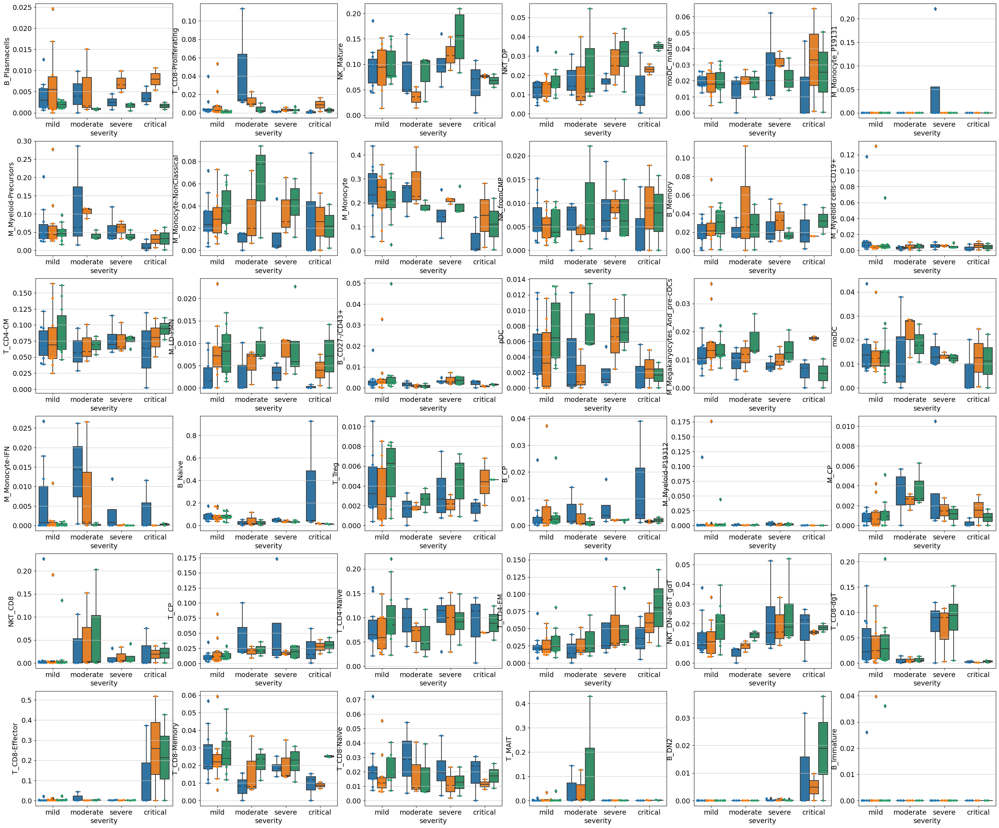

In [156]:
graph_nrows, graph_ncols = 6, 6

celltype_list = list(adata.obs['cell_type'].unique())
celltype_list.remove(np.nan)

fig1, f1_axes = plt.subplots(ncols=graph_ncols, nrows=graph_nrows, figsize=(35., 30.))

for i in range(graph_nrows):
    for j in range(graph_ncols):
        try:
            celltype = np.array(celltype_list)[i*graph_ncols+j]
        except IndexError:
            continue
        sns.boxplot(y=celltype, x="severity", hue="time", data=table_norm, ax=f1_axes[i][j])
        sns.swarmplot(y=celltype, x="severity", hue="time", data=table_norm, dodge=True, ax=f1_axes[i][j])
        f1_axes[i][j].get_legend().remove()

fig1.savefig(os.path.join(graph_folder, "celltypes_boxplots.pdf"), bbox_inches="tight")

new boxplot+swarmplot for each celltype, dropping moderate, and grouped by severity_coarse and time

In [157]:
table_percent = table_norm.copy()
for ctype in list(adata.obs['cell_type'].unique()):
    try:
        table_percent[ctype] = table_norm[ctype] * 100
    except KeyError:
        pass

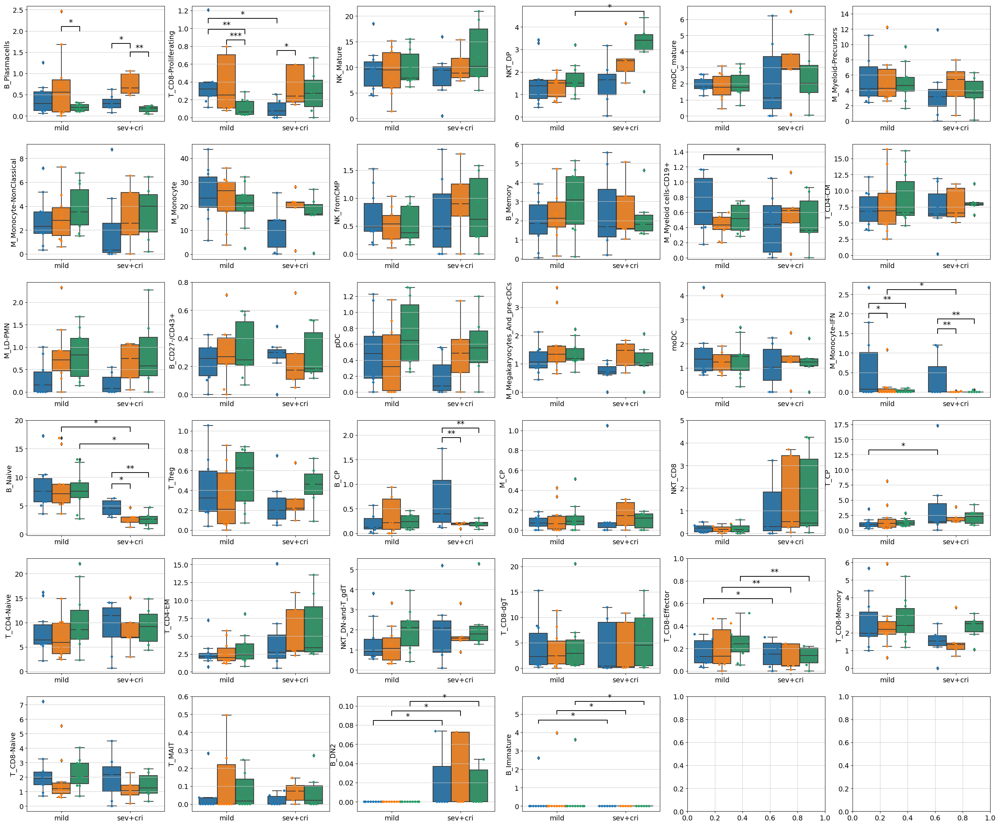

In [158]:
graph_nrows, graph_ncols = 6, 6

celltype_list = list(adata.obs['cell_type'].unique())
celltype_list.remove('M_Monocyte_P19131')
celltype_list.remove( 'M_Myeloid-P19312')
celltype_list.remove(np.nan)
    
fig2, f2_axes = plt.subplots(ncols=graph_ncols, nrows=graph_nrows, figsize=(35., 30.))

for i in range(graph_nrows):
    for j in range(graph_ncols):
        try:
            celltype = np.array(celltype_list)[i*graph_ncols+j]
        except IndexError:
            continue
        sns.boxplot(y=celltype, x="severity_coarse", hue="time",
                    data=table_percent[table_norm.severity != 'moderate'], ax=f2_axes[i][j])
        sns.swarmplot(y=celltype, x="severity_coarse", hue="time",
                      data=table_percent[table_norm.severity != 'moderate'], dodge=True, ax=f2_axes[i][j])
        f2_axes[i][j].get_legend().remove()
        f2_axes[i][j].set_xlabel("")

        if celltype == 'T_CD8-Proliferating':
            f2_axes[i][j].set_ylim([-0.04, 1.25])
        elif celltype == 'M_Myeloid-Precursors':
            f2_axes[i][j].set_ylim([-0.02, 15])
        elif celltype == 'B_Memory':
            f2_axes[i][j].set_ylim([-0.02, 6])
        elif celltype == 'M_Myeloid cells-CD19+':
            f2_axes[i][j].set_ylim([-0.02, 1.5])
        elif celltype == 'B_CD27-/CD43+':
            f2_axes[i][j].set_ylim([-0.02, 0.8])
        elif celltype == 'B_Naive':
            f2_axes[i][j].set_ylim([-0.2, 20])
        elif celltype == 'B_CP':
            f2_axes[i][j].set_ylim([-0.04, 2.3])
        elif celltype == 'T_CD8-Effector':
            f2_axes[i][j].set_ylim([-0.02, 1])
        elif celltype == 'NKT_CD8':
            f2_axes[i][j].set_ylim([-0.08, 5])   
        elif celltype == 'T_MAIT':
            f2_axes[i][j].set_ylim([-0.04, 0.6])
        elif celltype == 'B_DN2':
            f2_axes[i][j].set_ylim([-0.01, 0.11])
            
        x_mild_admission, x_mild_discharge, x_mild_post1mo = -0.2666666667, 0., 0.2666666667
        x_sevcri_admission, x_sevcri_discharge, x_sevcri_post1mo = x_mild_admission + 1., x_mild_discharge + 1., x_mild_post1mo + 1.

        def plot_significance_labels(ax, plot_pars):
            h = (ax.get_ylim()[1]-ax.get_ylim()[0])/25.
            for x1, x2, y, sym in plot_pars:
                ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c='k')
                ax.text((x1+x2)*.5, y+h, sym, ha='center', va='bottom', color='k', size="large")
                
        if celltype == 'B_Plasmacells':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_discharge, x_sevcri_post1mo, 1.4, '**'],
                [x_sevcri_admission, x_sevcri_discharge, 1.6, '*'],
                [x_mild_discharge, x_mild_post1mo, 2.0, '*'],
                         ])
        elif celltype == 'T_CD8-Proliferating':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_sevcri_discharge, 0.7, '*'],
                [x_mild_discharge, x_mild_post1mo, 0.82, '***'],
                [x_mild_admission, x_mild_post1mo, 0.94, '**'],
                [x_mild_admission, x_sevcri_admission, 1.06, '*'],
                         ])
        elif celltype == 'NKT_DP':
            plot_significance_labels(f2_axes[i][j], [
                [x_mild_post1mo, x_sevcri_post1mo, 4.5, '*'],
                         ])
        elif celltype == 'M_Myeloid cells-CD19+':
            plot_significance_labels(f2_axes[i][j], [
                [x_mild_admission, x_sevcri_admission, 1.3, '*'],
                         ])
        elif celltype == 'M_Monocyte-IFN':
            plot_significance_labels(f2_axes[i][j], [
                [x_mild_admission, x_mild_post1mo, 2.15, '**'],
                [x_mild_admission, x_mild_discharge, 1.9, '*'],
                [x_sevcri_admission, x_sevcri_post1mo, 1.75, '**'],
                [x_sevcri_admission, x_sevcri_discharge, 1.5, '**'],
                [x_mild_discharge, x_sevcri_discharge, 2.5, '*'],
                         ])    
        elif celltype == 'B_Naive':
            plot_significance_labels(f2_axes[i][j], [
                [x_mild_discharge, x_sevcri_discharge, 18, '*'],
                [x_mild_post1mo, x_sevcri_post1mo, 15, '*'],
                [x_sevcri_admission, x_sevcri_post1mo, 10, '**'],
                [x_sevcri_admission, x_sevcri_discharge, 8, '*'],
                         ])
        elif celltype == 'B_CP':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_sevcri_post1mo, 2.05, '**'],
                [x_sevcri_admission, x_sevcri_discharge, 1.85, '**'],
                         ])
        elif celltype == 'T_CP':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_mild_admission, 12.5, '*'],
                         ])    
        elif celltype == 'T_CD8-Effector':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_mild_admission, 0.6, '*'],
                [x_sevcri_discharge, x_mild_discharge, 0.7, '**'],
                [x_sevcri_post1mo, x_mild_post1mo, 0.8, '**'],
                         ])
        elif celltype == 'B_DN2':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_mild_admission, 0.08, '*'],
                [x_sevcri_discharge, x_mild_discharge, 0.09, '*'],
                [x_sevcri_post1mo, x_mild_post1mo, 0.10, '*'],
                         ])
        elif celltype == 'B_Immature':
            plot_significance_labels(f2_axes[i][j], [
                [x_sevcri_admission, x_mild_admission, 4.5, '*'],
                [x_sevcri_discharge, x_mild_discharge, 5, '*'],
                [x_sevcri_post1mo, x_mild_post1mo, 5.5, '*'],
                         ])    

fig2.savefig(os.path.join(graph_folder, "celltypes_boxplots_coarse_severity.pdf"), bbox_inches="tight")

create a heatmap: celltype vs sample, with dendrogram on both sides

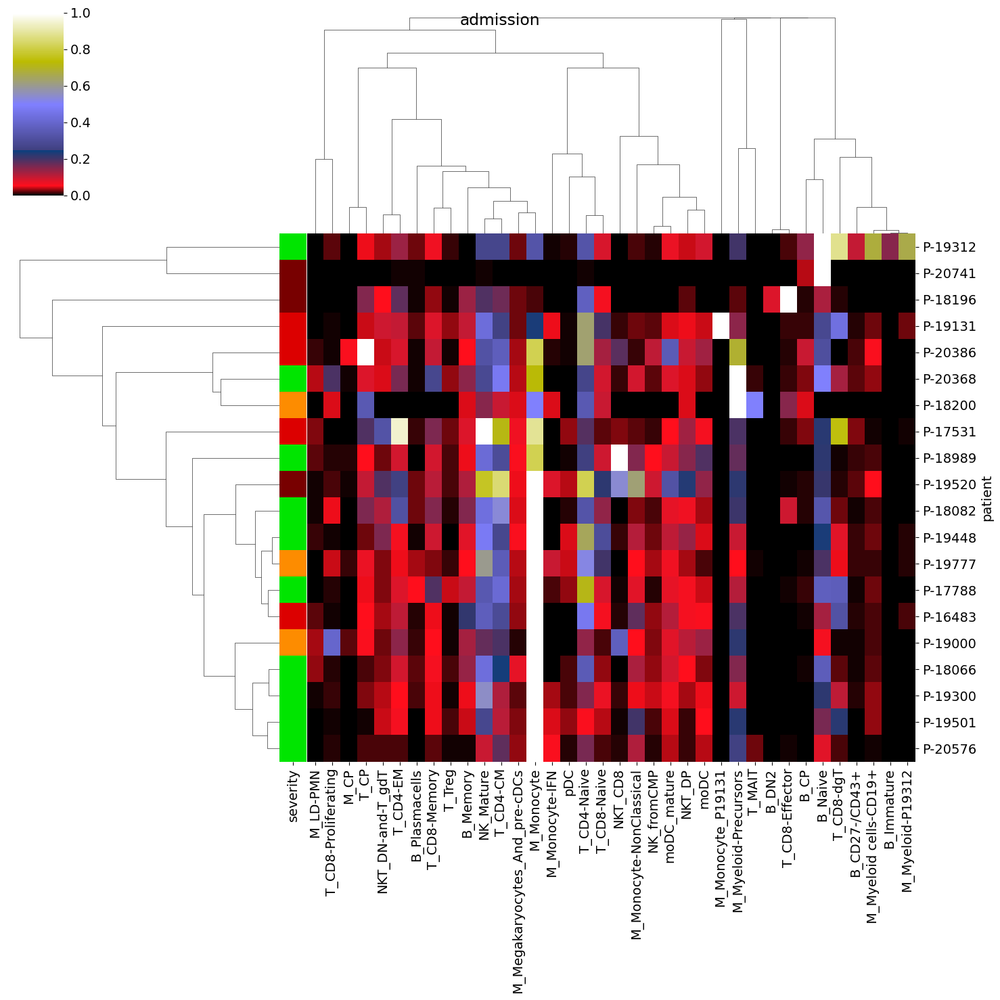

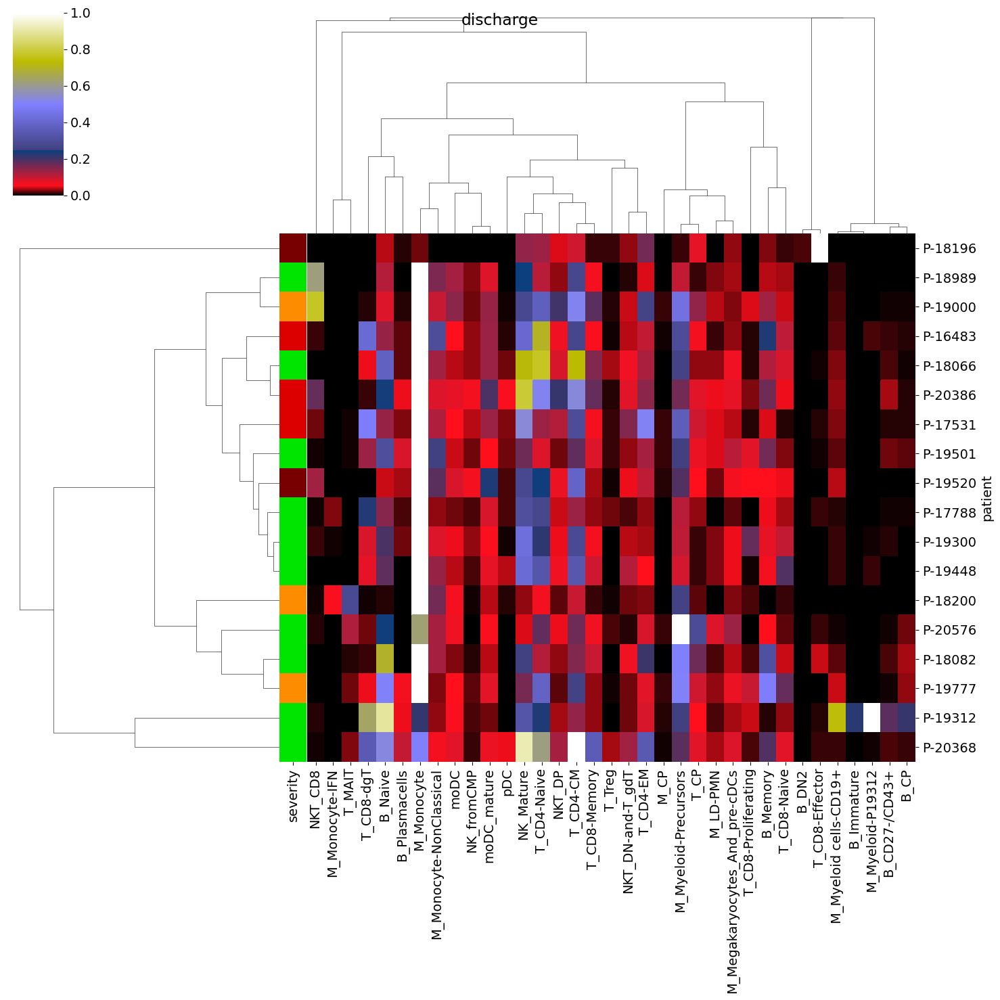

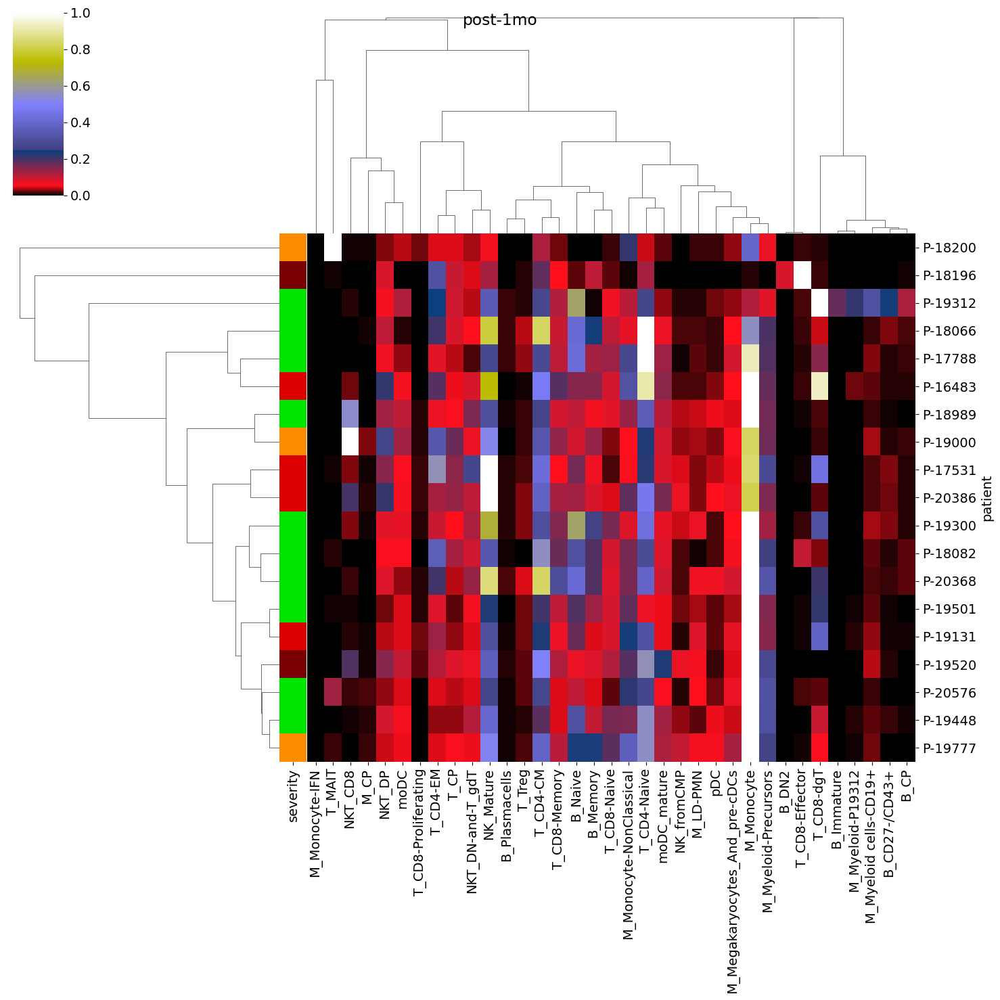

In [159]:
color_code_severity = dict(zip(table_norm["severity"].unique(),
                               ["#00e500", "#fd8c00", "#dc0000", "#780000"]))

for time in ['admission', 'discharge', 'post-1mo']:
    # extract table
    table_for_heatmap = table_norm[table_norm["time"] == time].copy()
    table_for_heatmap = table_for_heatmap.loc[:, (table_for_heatmap != 0).any(axis=0)]
    table_for_heatmap.set_index("patient", inplace=True)
    row_colors = table_for_heatmap["severity"].map(color_code_severity)
    table_for_heatmap.drop(["time", "severity", "severity_coarse"], axis=1, inplace=True)
    # plot table to heatmap
    sns.clustermap(table_for_heatmap, row_colors=row_colors, cmap='gist_stern', method="complete",
                   standard_scale=0, yticklabels=1, xticklabels=1, figsize=(15, 15), metric='cosine',
                   dendrogram_ratio=0.3).fig.suptitle(time)
    plt.savefig(os.path.join(graph_folder, "heatmap_{}.pdf".format(time)), bbox_inches="tight")

## 18) DEGs

define two functions used later

In [160]:
def add_universe(deg_in, universe):
    deg_u = pd.DataFrame(index=universe, columns=['gene', 'log2fc', 'pval', 'qval', 'mean'])
    deg_u['gene'], deg_u['log2fc'], deg_u['pval'], deg_u['qval'], deg_u['mean'] = deg_u.index, 0, 1, 1, 0
    deg_in.index = deg_in.gene
    deg_u.loc[deg_in.gene, :] = deg_in
    deg_u = deg_u.reset_index(drop=True)
    return deg_u

In [161]:
def adata_degs(adata, out_path, obs_to_compare='condition', comparison=('cond1', 'cond2'),
               min_num_cells=20, universe=()):

    if len(universe) == 0:
        universe = adata.var_names.tolist()

    # extract only the categories to compare and convert to dense matrix
    adata = adata[adata.obs[obs_to_compare].isin(comparison)].copy()
    if scipy.sparse.issparse(adata.X):
        adata.X = adata.X.todense()

    # exclude markers that are expressed in fewer than min_num_cells cells
    df_sc = pd.DataFrame(index=adata.obs_names.tolist(), data=adata.X, columns=adata.var_names.tolist())
    input_markers_expressed = np.array(adata.var_names.tolist())[
        np.where((df_sc > 0).sum(axis=0) > min_num_cells)[0]].tolist()
    adata = adata[:, adata.var_names.isin(input_markers_expressed)]

    # compute DEGs
    res = de.test.two_sample(adata, grouping=obs_to_compare, test='rank')
    deg = res.summary()
    groups = np.unique(res.grouping)

    logfc_txt = '# logFC: ' + groups[1] + ' / ' + groups[0]
    deg = deg.sort_values(by=['qval']).loc[:, ['gene', 'log2fc', 'pval', 'qval', 'mean']]
    degs = add_universe(deg, universe)
    with open(out_path + '.csv', 'w+') as file:
        file.write(logfc_txt + '\n')
        degs.to_csv(file, index=False)

define dataset extracting 'discharge', 'admission' and 'post-1mo'

In [162]:
adata_DEGS = adata[adata.obs.time.isin(['discharge', 'admission', 'post-1mo'])]
for label in ['cell_families', 'severity', 'time', 'cell_type']:
    adata_DEGS.obs[label] = adata_DEGS.obs[label].astype('str')

Trying to set attribute `.obs` of view, copying.


full list of genes

In [163]:
gene_list = adata.var_names.tolist()

comparisons to include in the DEG analysis

In [164]:
severity_comp = [list(map(str, comb)) for comb in combinations(adata_DEGS.obs['severity'].unique(), 2)]
time_comp = [list(map(str, comb)) for comb in combinations(adata_DEGS.obs['time'].unique(), 2)]
sev_coarse_comp = [["mild", "sev+cri"], ["moderate", "sev+cri"]]

create output directory where to store DEGs files

In [165]:
target_dir = os.path.join(result_folder, "DEGS")
if not os.path.isdir(target_dir): os.mkdir(target_dir)

### DEGS focusing on the different cell families (macroclusters of cells)

In [ ]:
for C1 in adata_DEGS.obs['cell_families'].unique():

    # skip unidentified cells
    if C1 is np.nan:
        continue

    # create folder in Result
    target_dir = os.path.join(result_folder, "DEGS", C1)
    if not os.path.isdir(target_dir): os.mkdir(target_dir)

    for C3 in adata_DEGS.obs['time'].unique():

        # fix cell type and time
        print('* Computing DEGS for cell family "{}" and time "{}"'.format(C1, C3))
        adata_con = adata_DEGS[(adata_DEGS.obs['cell_families'] == C1) & (adata_DEGS.obs['time'] == C3)].copy()

        # compare different severity values
        for comp in severity_comp:
            out_file_name = 'severityOverTime_{}_{}_{}_vs_{}'.format(C1, C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            adata_degs(adata_con, out_path=out_file_path, obs_to_compare='severity', comparison=[comp[0], comp[1]],
                       min_num_cells=20, universe=gene_list)

        # compare ["mild" vs "severe+critical"] and ["moderate" vs "severe+critical"]
        for comp in sev_coarse_comp:
            out_file_name = 'severityOverTime_{}_{}_{}_vs_{}'.format(C1, C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            adata_degs(adata_con, out_path=out_file_path, obs_to_compare='severity_coarse',
                       comparison=[comp[0], comp[1]], min_num_cells=20, universe=gene_list)

    for C3 in adata_DEGS.obs['severity'].unique():

        adata_con = adata_DEGS[(adata_DEGS.obs['cell_families'] == C1) & (adata_DEGS.obs['severity'] == C3)].copy()
        print('* Computing DEGS for cell family "{}" and severity "{}"'.format(C1, C3))

        for comp in time_comp:
            out_file_name = 'timeOverSeverity_{}_{}_{}_vs_{}'.format(C1, C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            adata_degs(adata_con, out_path=out_file_path, obs_to_compare='time', comparison=[comp[0], comp[1]],
                       min_num_cells=20, universe=gene_list)

DEGS focusing on the different cell types (microclusters of cells)

In [ ]:
for C1 in adata_DEGS.obs['cell_type'].unique():

    # skip unidentified cells
    if C1 is np.nan:
        continue

    # create folder in Result
    target_dir = os.path.join(result_folder, "DEGS", C1.replace("/","_"))
    if not os.path.isdir(target_dir): os.mkdir(target_dir)

    for C3 in adata_DEGS.obs['time'].unique():

        # fix cell type and time
        print('* Computing DEGS for cell type "{}" and time "{}"'.format(C1, C3))
        adata_con = adata_DEGS[(adata_DEGS.obs['cell_type'] == C1) & (adata_DEGS.obs['time'] == C3)].copy()

        # compare different severity values
        for comp in severity_comp:
            out_file_name = 'severityOverTime_{}_{}_{}_vs_{}'.format(C1.replace("/","_"), C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            try:
                adata_degs(adata_con, out_path=out_file_path, obs_to_compare='severity', comparison=[comp[0], comp[1]],
                           min_num_cells=20, universe=gene_list)
            except ValueError:
                continue

        # compare ["mild" vs "severe+critical"] and ["moderate" vs "severe+critical"]
        for comp in sev_coarse_comp:
            out_file_name = 'severityOverTime_{}_{}_{}_vs_{}'.format(C1.replace("/","_"), C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            try:
                adata_degs(adata_con, out_path=out_file_path, obs_to_compare='severity_coarse',
                           comparison=[comp[0], comp[1]], min_num_cells=20, universe=gene_list)
            except ValueError:
                continue

    for C3 in adata_DEGS.obs['severity'].unique():

        adata_con = adata_DEGS[(adata_DEGS.obs['cell_type'] == C1) & (adata_DEGS.obs['severity'] == C3)].copy()
        print('* Computing DEGS for cell type "{}" and severity "{}"'.format(C1, C3))

        for comp in time_comp:
            out_file_name = 'timeOverSeverity_{}_{}_{}_vs_{}'.format(C1.replace("/","_"), C3, comp[0], comp[1])
            out_file_path = os.path.join(target_dir, out_file_name)
            try:
                adata_degs(adata_con, out_path=out_file_path, obs_to_compare='time', comparison=[comp[0], comp[1]],
                           min_num_cells=20, universe=gene_list)
            except ValueError:
                continue
